In [1]:
# imports

import matplotlib as mpl
import numpy as np
import pandas as pd
import seaborn as sns
import xarray as xr

from matplotlib import pyplot as plt
from pathlib import Path
from tensorly.cp_tensor import CPTensor

# stop showing SettingWithCopyWarning
pd.options.mode.chained_assignment = None


In [2]:
# set aesthetic parameters

line_color = '#0F0A0A'    # dark
# line_color = '#E5E4E2'    # light

neutral_color = '#E0E0E0'

# thursday
accent_colors = ['#9B5DE5', '#FFAC69', '#00C9AE', '#FD3F92', '#0F0A0A', 
                 '#959AB1', '#FFDB66', '#63B9FF','#FFB1CA', '#4F1DD7']

style = {'axes.edgecolor': line_color,
         'axes.labelcolor': line_color,
         'text.color': line_color,
         'xtick.color': line_color,
         'ytick.color': line_color,
         'font.family': 'Helvetica',
         'font.Helvetica': ['Helvetica']}

palette = sns.color_palette(accent_colors)

sns.set_context('talk', rc={'lines.linewidth': 2})
sns.set_palette(palette)
# sns.set_palette('tab20')
sns.set_style('ticks', style)

plt.rcParams['legend.frameon'] = False
plt.rcParams['axes.spines.left'] = True
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.bottom'] = True
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['patch.linewidth'] = 0
plt.rcParams['patch.edgecolor'] = 'none'
plt.rcParams['savefig.dpi'] = 300

# clade names
clade_display_names = {
    'HLI': 'HLI', 
    'HLII': 'HLII', 
    'LLI': 'LLI', 
    '5.1B-I': 'I', 
    '5.1A-II': 'II', 
    '5.1A-III': 'III', 
    '5.1A-IV': 'IV', 
    '5.1B-CRD1': 'CRD1', 
    '5.1A-CRD2': 'CRD2', 
    '5.1A-UC-A-EnvC': 'UC-A'
}


In [3]:
# helpful functions
    
# function to select subset of indices in cp tensor
def subset_cp_tensor(cp_tensor, subset_indices):
    '''Selects subset of cp_tensor based on provided indices
    
    Parameters
    ----------
    cp_tensor : tensorly.CPTensor
        CPTensor object with (weights, factors).
    subset_indices : dict(int: index-like)
        Dictionary with mode as key and value an integer index of 
        the positions to be downselected from `cp_tensor`.
        Example: {1: [0, 1, 3, 4, 5, 8]}
        
    Returns
    -------
    subset_cp : tensorly.CPTensor
        Subset CPTensor.
    '''
    weights, factors = cp_tensor
    new_factors = factors.copy()
    for mode, index in subset_indices.items():
        new_factors[mode] = factors[mode][index]
    return(CPTensor((weights, new_factors)))

# unique bin function
def unique_bins(array, n_bins, bounds=None, reverse=False):
    '''This is a function that maps an array of continuous values with potential duplicates to 
    a set of bins in such a way that each of the original continuous values is mapped to a unique bin, and the
    distribution of binned values approximates the distribution of continuous values as closely as possible.
    
    My quick and dirty approach to this problem sorts the input array into the appropriate number of bins. Then,
    starting in the middle and alternating outward left and right, the algorithm checks to see if each bin has 
    more than one resident. If so, it will again alternate outward left and right from that position and allocate
    the extra residents to the nearest free bins.
    
    Parameters
    ----------
    array : np.array
        Sorted array of values to be placed into bins.
    n_bins : int
        Number of bins to use.
    bounds : (float, float)
        Upper and lower bounds to use for bin-mapping.
    reverse : bool
        Optional flag to reverse the index ordering of the output.
    
        
    Returns
    -------
    index : np.array
        Indices indicating mapping of input values to bins, where index[i] indicates the index of the bin 
        mapping of input value array[i] (assuming input array is sorted).
    '''
    # check number of bins
    if not n_bins >= len(array):
        raise ValueError('The number of bins must be >= len(array).')
    # add bounds if supplied
    if bounds is not None:
        array = np.concatenate((array, bounds))
    # make histogram
    counts, _ = np.histogram(array, bins=n_bins)
    # remove bounds if added
    if bounds is not None:
        counts[0] -= 1
        counts[-1] -= 1
    # start from the middle
    i = int(n_bins/2)
    for j in range(n_bins):
        # alternate left and right
        if j % 2:
            i -= j
        else:
            i += j
        # resolve collisions
        if counts[i] > 1:
            # set new counter for exploring nearby positions
            k = i
            for l in range(2*n_bins):
                # alternate left and right
                if l % 2:
                    k -= l
                else:
                    k += l
                # check if we're still in range
                if 0 <= k < n_bins:
                    # check for an empty spot
                    if counts[k] == 0:
                        counts[k] = 1
                        counts[i] -= 1
                        # check if all collisions have been resolved yet
                        if counts[i] == 1:
                            break
    # select indices of non-zero values
    index = np.where(counts == 1)[0]
    # reverse if requested
    if reverse:
        index = (n_bins - 1) - index
    return index


# import data

In [4]:
# read in aligned model datasets

datapath = Path('../../data/')

pro_ds = xr.open_dataset(datapath / '5-models/pro-aligned-models.nc')
syn_ds = xr.open_dataset(datapath / '5-models/syn-aligned-models.nc')

pro_ds


<xarray.Dataset>
Dimensions:          (Bootstrap: 100, Replicate: 3, Component: 15,
                      Ortholog: 5023, Clade: 3, SampleName: 74)
Coordinates:
  * Bootstrap        (Bootstrap) int64 0 1 2 3 4 5 6 7 ... 93 94 95 96 97 98 99
  * Replicate        (Replicate) object 'A' 'B' 'C'
  * Component        (Component) int64 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15
  * Ortholog         (Ortholog) int64 60000001 60000002 ... 60040287 60040292
  * Clade            (Clade) object 'HLI' 'HLII' 'LLI'
  * SampleName       (SampleName) object 'G1.SURF.NS.S02C1.15m' ... 'G3.UW.NS...
Data variables:
    ComponentWeight  (Bootstrap, Replicate, Component) float64 ...
    GeneWeight       (Bootstrap, Replicate, Component, Ortholog) float64 ...
    TaxonWeight      (Bootstrap, Replicate, Component, Clade) float64 ...
    SampleWeight     (Bootstrap, Replicate, Component, SampleName) float64 ...
    Sample           (Bootstrap, Replicate, SampleName) object ...
    Annotation       (Ortholog) object ...
Attributes:
    Rank:               15
    Lambda:             15.0
    AlignRefBootstrap:  66
    AlignRefReplicate:  B

In [5]:
# fetch sample metatdata and shuffled sample label inputs

metadata_df = pd.read_csv(datapath / 'metadata/sample_metadata_merged.csv').fillna('')
metadata_df['Datetime'] = pd.to_datetime(metadata_df['Datetime'])

metadata_df


,SampleName,Cruise,Year,Datetime,Latitude,Longitude,Depth,Dataset,SampleGroup,TimeFraction,TimeClass,Replicates,Experiment,Condition,Treatment,Timepoint
0,G2.DCM.NS.S11C2.50m,Gradients 2,2017,2017-06-06 06:56:00,36.999833,-158.000,50,Gradients 2 DCM,depth profiles,0.29,6am,1,,,,
1,G2.DCM.NS.S15C2.56m,Gradients 2,2017,2017-06-09 05:30:00,34.000167,-158.000,56,Gradients 2 DCM,depth profiles,0.23,6am,3,,,,
2,G2.DCM.NS.S17C3.87m,Gradients 2,2017,2017-06-10 09:34:00,32.000167,-158.000,87,Gradients 2 DCM,depth profiles,0.40,10am,3,,,,
3,G2.DCM.NS.S18C2.95m,Gradients 2,2017,2017-06-11 05:50:00,29.582000,-158.002,95,Gradients 2 DCM,depth profiles,0.24,6am,3,,,,
4,G3.DEPTH.NS.S4C6.75m,Gradients 3,2019,2019-04-16 08:00:00,41.670000,-158.050,75,Gradients 3 depth profile,depth profiles,0.33,10am,1,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,G3.DEPTH.NS.S6C7.15m,Gradients 3,2019,2019-04-22 06:44:00,32.920000,-158.000,15,Gradients 3 depth profile,surface transect,0.28,6am,2,,,,
83,G3.UW.NS.UW40_1.7m,Gradients 3,2019,2019-04-24 05:57:00,40.880000,-158.000,7,Gradients 3 underway,surface transect,0.25,6am,3,,,,
84,G3.DEPTH.NS.S8C2.15m,Gradients 3,2019,2019-04-24 14:47:00,42.330000,-158.000,15,Gradients 3 depth profile,surface transect,0.62,2pm,2,,,,
85,G3.UW.NS.UW40_2.7m,Gradients 3,2019,2019-04-25 06:01:00,40.090000,-158.000,7,Gradients 3 underway,surface transect,0.25,6am,3,,,,


# _Prochlorococcus_ clusters

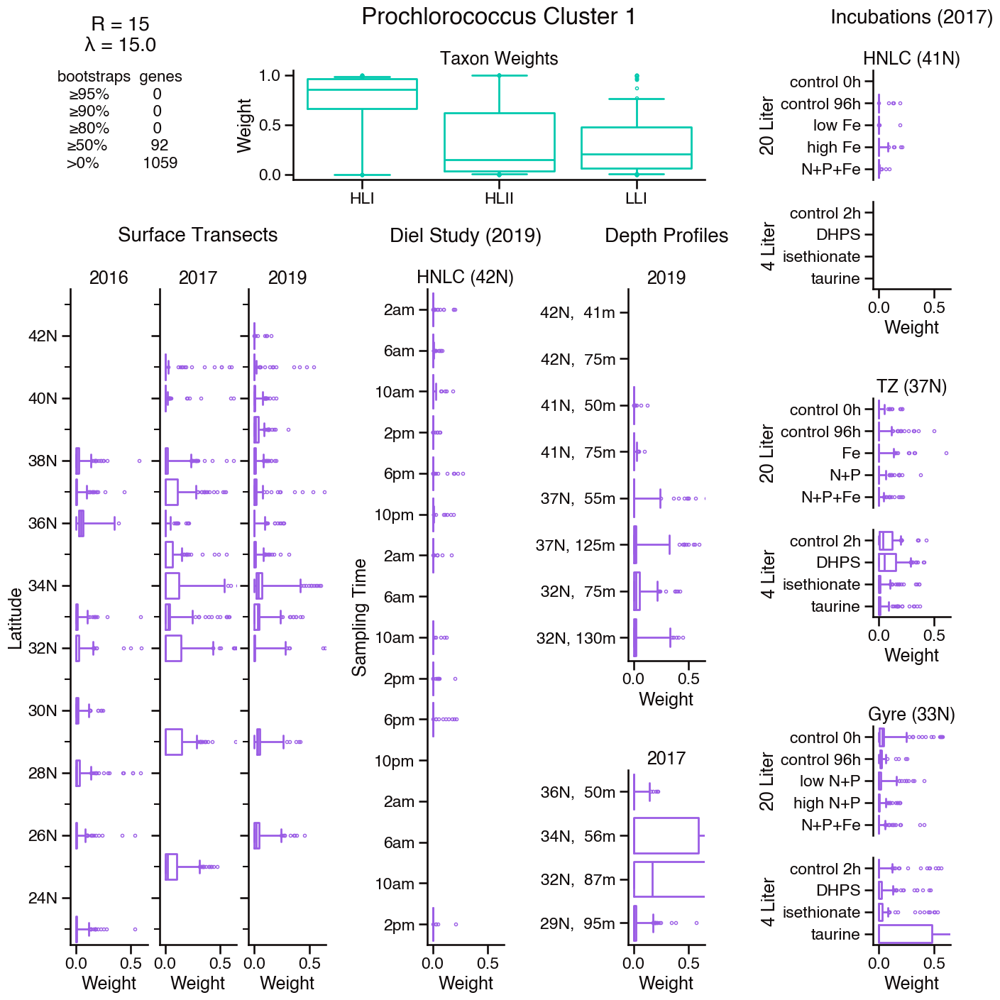

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60000877,0.130879,0.109309,0.660000,transcription-repair coupling factor (superfam...
1,60000394,0.122812,0.085357,0.660000,Dipeptidyl aminopeptidase/acylaminoacyl peptidase
2,60000484,0.114982,0.083413,0.660000,cell division protein FtsI (penicillin-binding...
3,60000446,0.112972,0.111625,0.663333,"Sporulation protein YlmC, PRC-barrel domain fa..."
4,60000207,0.112576,0.079051,0.656667,S-adenosylmethionine:tRNA ribosyltransferase-i...
5,60000822,0.106955,0.076504,0.656667,glutamate 5-kinase
6,60000317,0.103515,0.079448,0.663333,phosphate:acyl-[acyl carrier protein] acyltran...
7,60000783,0.097333,0.075559,0.656667,cell division protein FtsW
8,60000607,0.094358,0.079838,0.656667,Apolipoprotein N-acyltransferase
9,60000741,0.087387,0.069626,0.660000,UDP-N-acetylmuramoylalanine--D-glutamate ligase


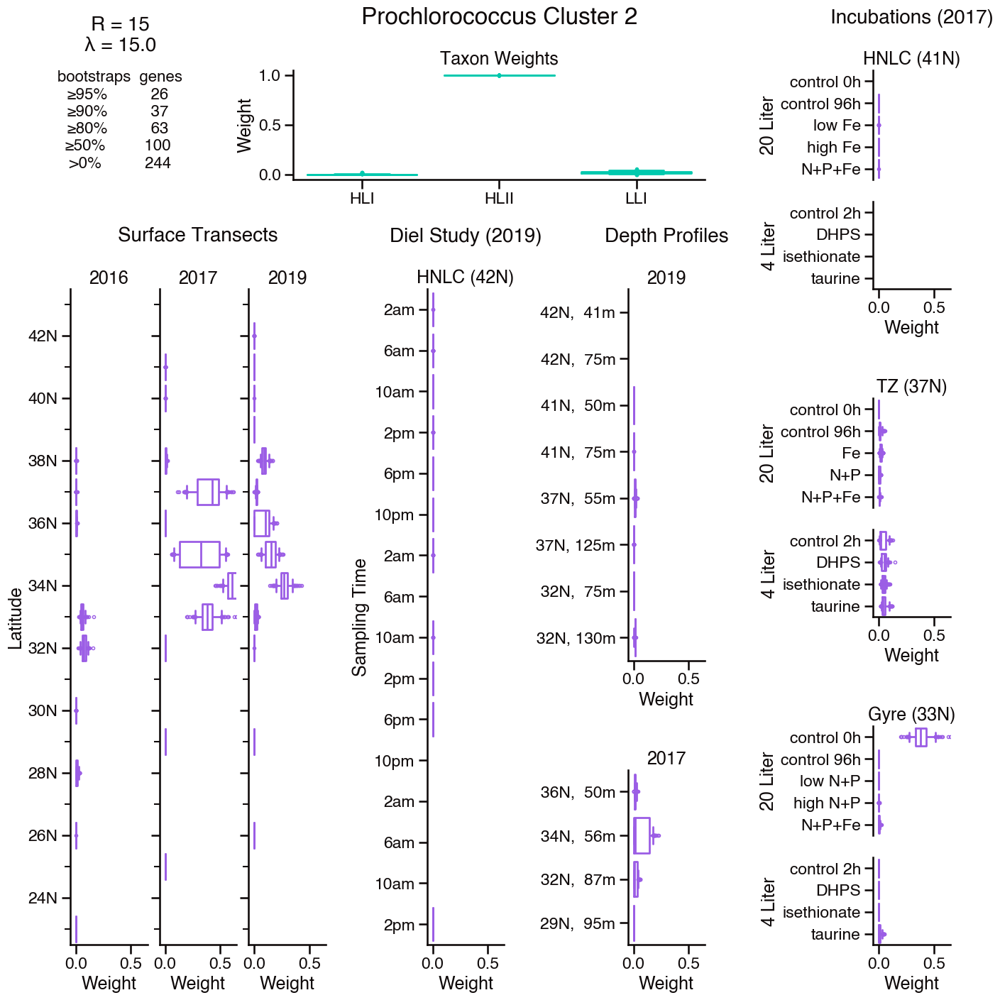

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60001478,0.225654,0.222134,0.990000,hypothetical protein
1,60002435,0.222916,0.214701,1.000000,type I restriction enzyme M protein
2,60002260,0.216341,0.208911,0.983333,autotransporter-associated beta strand repeat-...
3,60003365,0.213002,0.205444,0.990000,hypothetical protein
4,60001376,0.194426,0.188671,0.993333,Tetratricopeptide repeat-containing protein
5,60003165,0.174024,0.169287,0.973333,hypothetical protein
6,60001332,0.171295,0.151148,0.956667,"GDPmannose 4,6-dehydratase"
7,60000126,0.164572,0.156027,0.990000,UDPglucose 6-dehydrogenase
8,60002443,0.163670,0.159217,0.980000,Hemolysin activation/secretion protein
9,60001490,0.159424,0.147117,0.936667,"ATP-binding cassette, subfamily B"


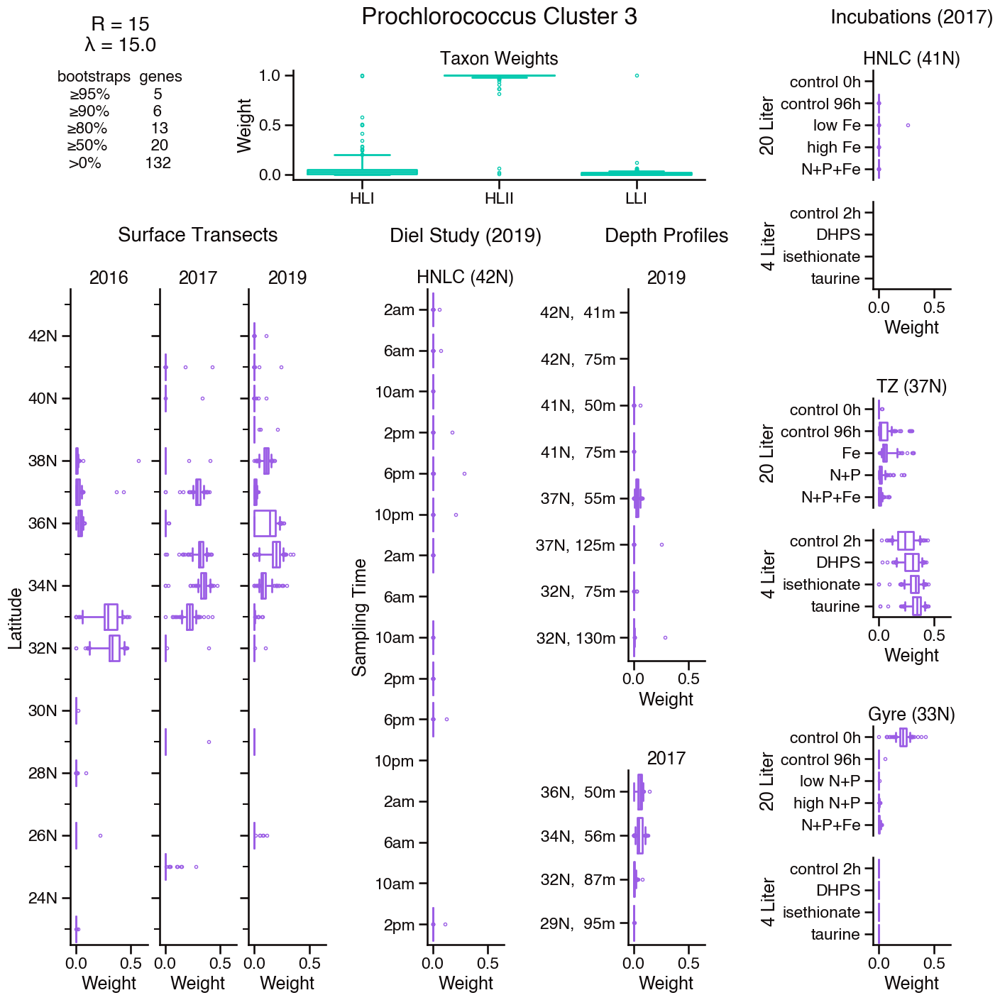

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60002365,0.444768,0.434717,0.990000,hypothetical protein
1,60019241,0.366515,0.344513,0.953333,"phage prohead protease, HK97 family/phage majo..."
2,60001792,0.350274,0.335687,0.966667,hypothetical protein
3,60008638,0.285624,0.301909,0.893333,hypothetical protein
4,60001883,0.278933,0.271066,0.980000,protein of unknown function (DUF4214)
5,60001866,0.261160,0.216529,0.843333,hypothetical protein
6,60000689,0.255859,0.242644,0.956667,"SOS-response transcriptional repressor, LexA"
7,60001845,0.155227,0.144024,0.830000,Invasin beta-domain of outer membrane
8,60001830,0.131960,0.127229,0.906667,hypothetical protein
9,60001535,0.131750,0.127674,0.893333,protein of unknown function (DUF4278)


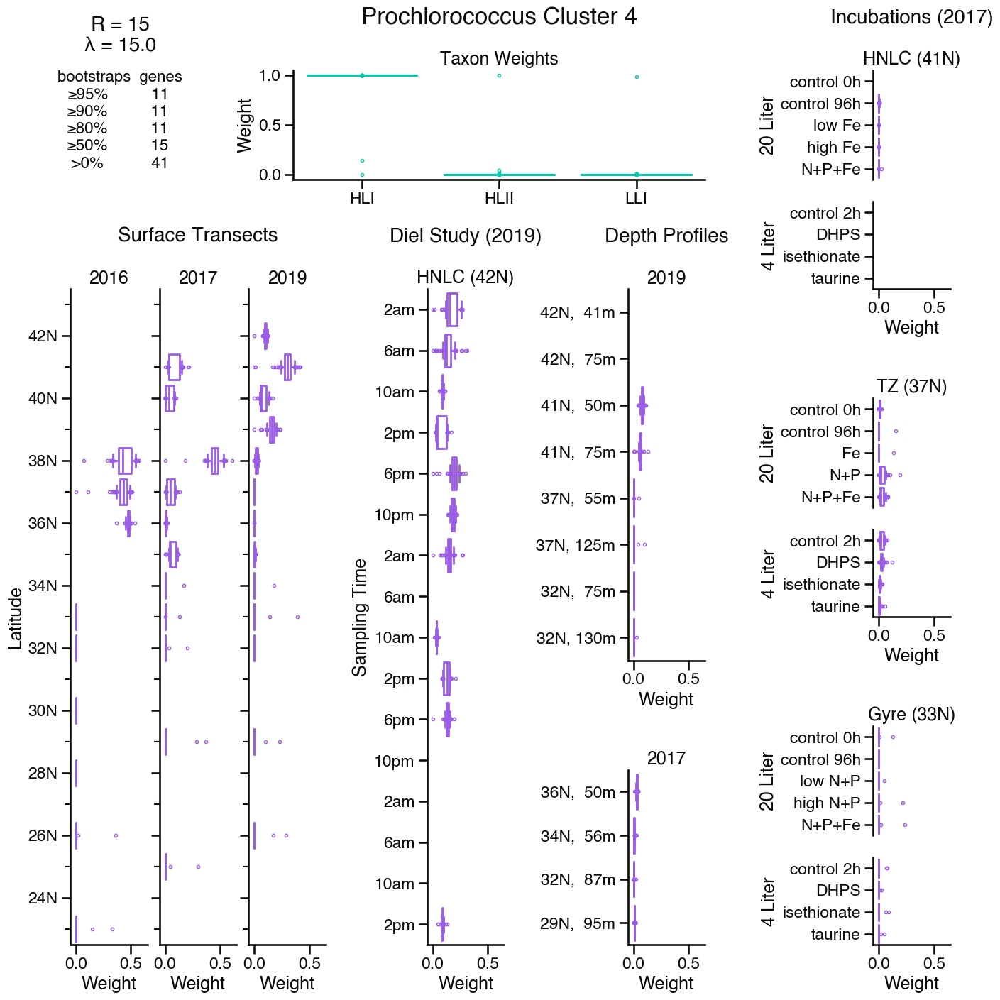

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60022546,0.476200,0.468214,0.973333,elongation factor 4
1,60019896,0.443089,0.440762,0.986667,KH domain-containing protein
2,60036903,0.389842,0.383599,0.990000,elongation factor 4
3,60019899,0.331860,0.327989,0.993333,MFS_1 like family protein
4,60026976,0.247014,0.239705,0.976667,TatD DNase family protein
5,60003126,0.239566,0.243356,0.993333,ATP-dependent RNA helicase RhlE
6,60019894,0.215125,0.208536,0.976667,U4/U6 small ribonucleoprotein PRP3
7,60023492,0.204224,0.199906,0.980000,hypothetical protein
8,60019897,0.200595,0.190782,0.983333,Kinase associated domain 1
9,60019895,0.160621,0.153969,0.976667,SAP domain-containing protein


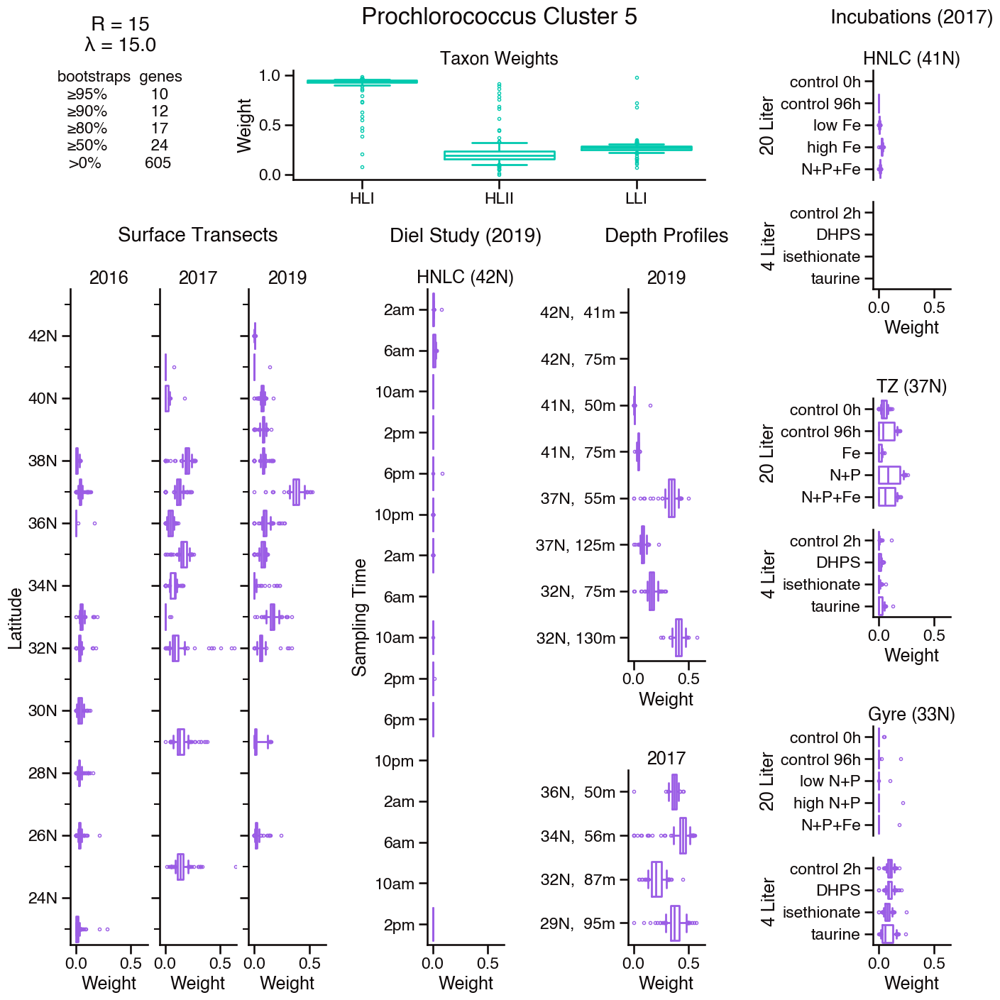

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60000979,0.480117,0.462299,0.986667,BMC domain-containing protein
1,60001081,0.457459,0.442380,0.986667,"ribulose 1,5-bisphosphate carboxylase small su..."
2,60000811,0.433262,0.422246,0.986667,Carboxysome shell peptide mid-region
3,60000978,0.400740,0.388618,0.986667,"ribulose 1,5-bisphosphate carboxylase large su..."
4,60000726,0.203376,0.192302,0.983333,F-type H+-transporting ATPase subunit b
5,60000742,0.152321,0.140114,0.963333,ATP synthase F0 subcomplex B' subunit
6,60000138,0.149377,0.143076,0.986667,ATP synthase F1 subcomplex beta subunit
7,60000052,0.105827,0.104371,0.970000,transketolase
8,60000833,0.100776,0.099302,0.956667,ATP synthase F0 subcomplex C subunit
9,60000624,0.093998,0.090770,0.946667,ATP synthase F0 subcomplex A subunit


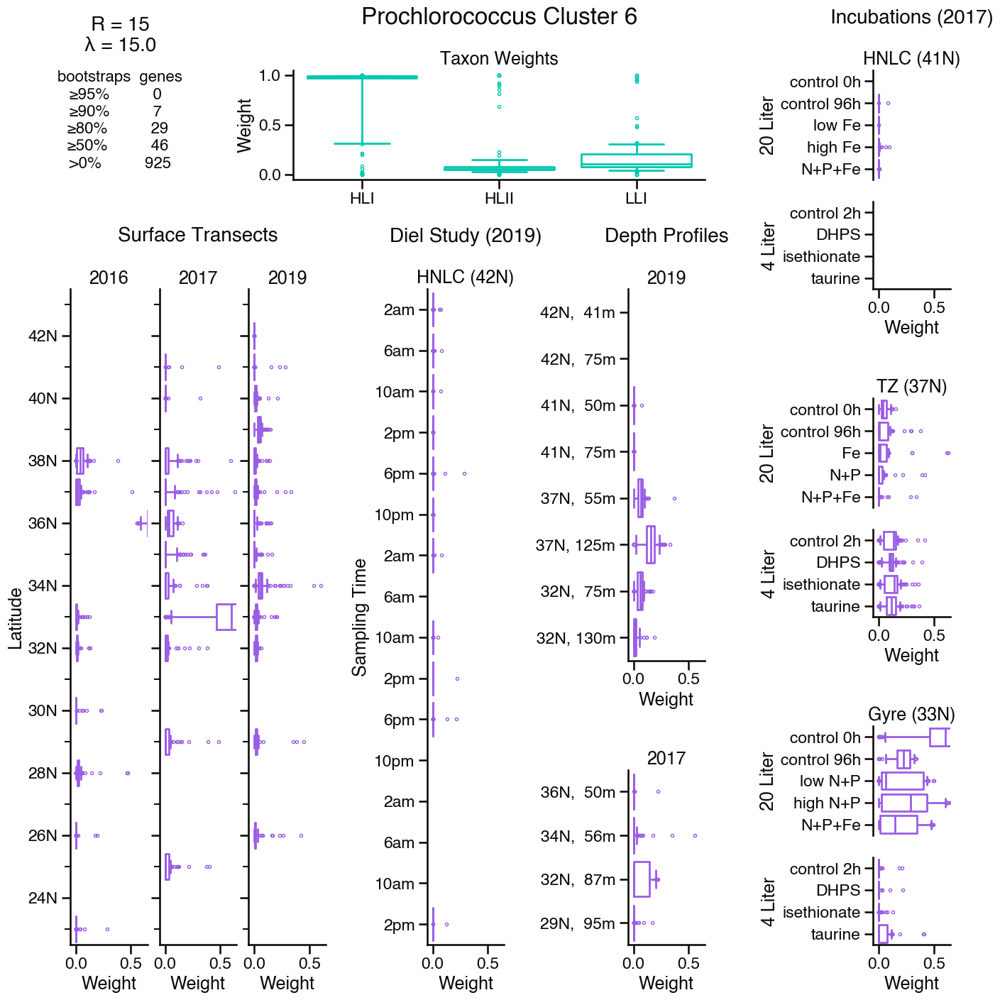

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60000720,0.276866,0.259657,0.903333,"ribonucleotide reductase, class II"
1,60000055,0.256888,0.231320,0.903333,hydroxymethylpyrimidine synthase
2,60000041,0.226080,0.211112,0.880000,cytochrome c oxidase subunit 1
3,60000696,0.212872,0.196178,0.903333,NAD(P) transhydrogenase subunit alpha
4,60000362,0.200990,0.183904,0.896667,RNA polymerase primary sigma factor
5,60000563,0.195572,0.165895,0.873333,L-glutamine synthetase
6,60000247,0.193075,0.173204,0.900000,NADH dehydrogenase subunit M
7,60000835,0.191462,0.171334,0.880000,"RNA polymerase sigma factor, sigma-70 family"
8,60000595,0.187531,0.171289,0.883333,transaldolase
9,60000143,0.180765,0.162813,0.893333,starch phosphorylase


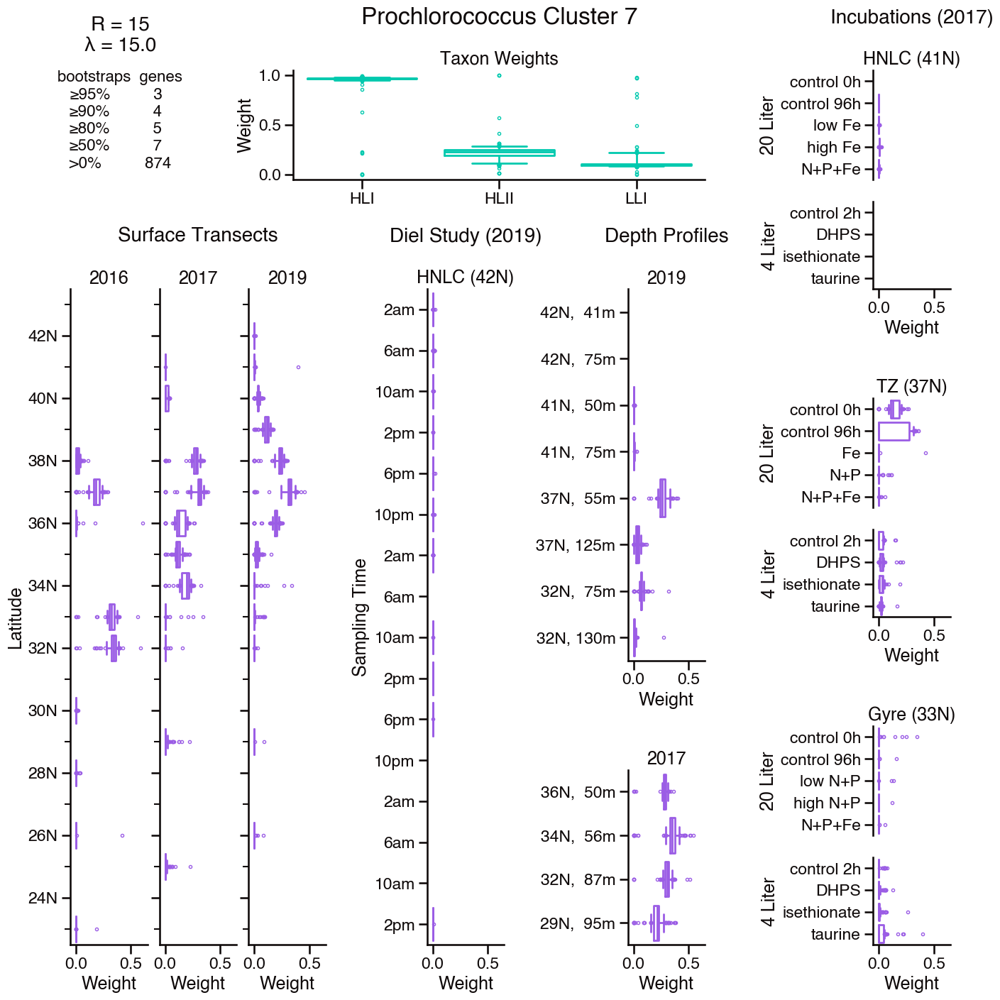

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60001290,0.750977,0.720630,0.963333,fructose-bisphosphate aldolase
1,60001112,0.587558,0.545460,0.960000,flavodoxin I
2,60000706,0.234282,0.216758,0.953333,iron(III) transport system substrate-binding p...
3,60000134,0.116634,0.109913,0.813333,RNA polymerase nonessential primary-like sigma...
4,60000023,0.081077,0.081416,0.910000,chlorophyll a/b binding light-harvesting prote...
5,60001361,0.021603,0.024689,0.616667,ribulose-5-phosphate 3-epimerase
6,60000381,0.011485,0.025088,0.570000,glyceraldehyde 3-phosphate dehydrogenase (NADP+)


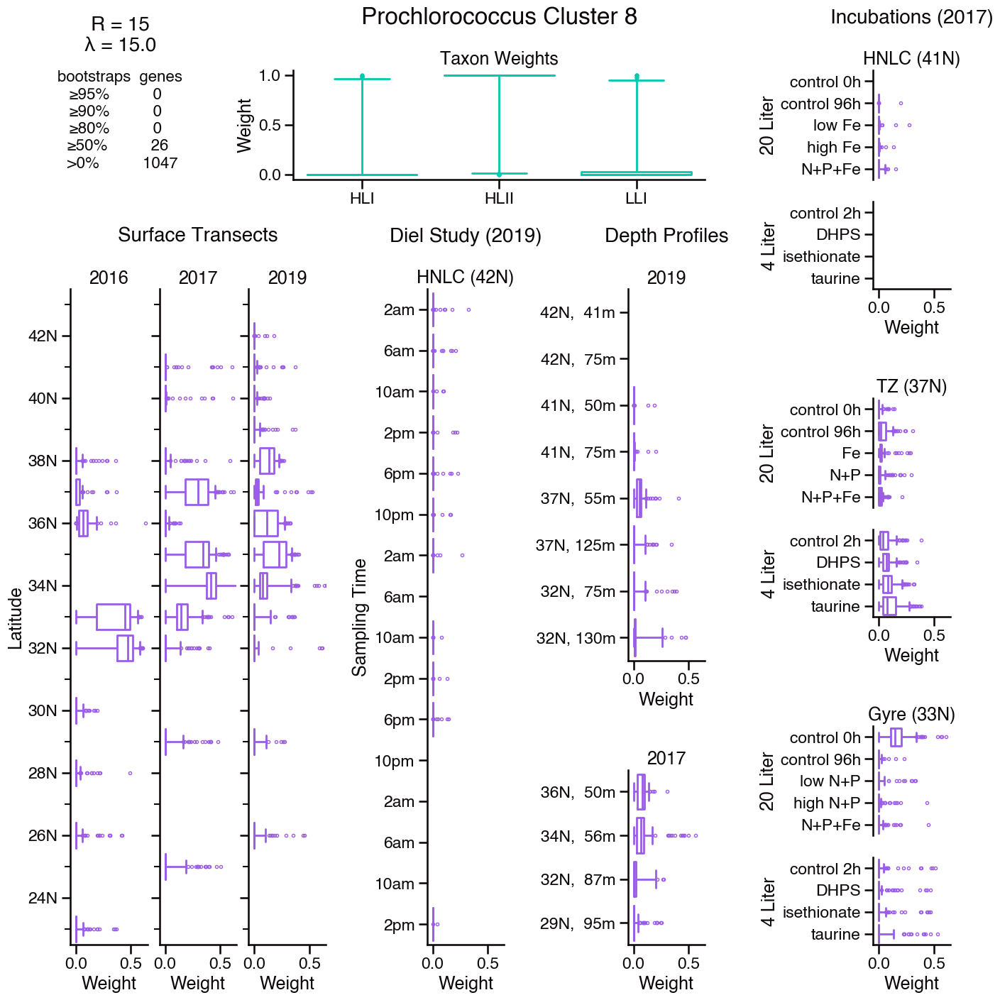

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60002870,0.307691,0.237483,0.716667,Curli biogenesis system outer membrane secreti...
1,60007541,0.298083,0.232943,0.693333,hypothetical protein
2,60000653,0.245799,0.203697,0.756667,ornithine carbamoyltransferase
3,60003513,0.230848,0.205514,0.680000,hypothetical protein
4,60003808,0.224145,0.190065,0.770000,hypothetical protein
5,60001845,0.146369,0.134441,0.683333,Invasin beta-domain of outer membrane
6,60000252,0.134131,0.121806,0.730000,hypothetical protein
7,60001866,0.098713,0.131606,0.646667,hypothetical protein
8,60000035,0.097128,0.109175,0.603333,phosphate ABC transporter substrate-binding pr...
9,60000459,0.093878,0.091738,0.676667,membrane protease FtsH catalytic subunit


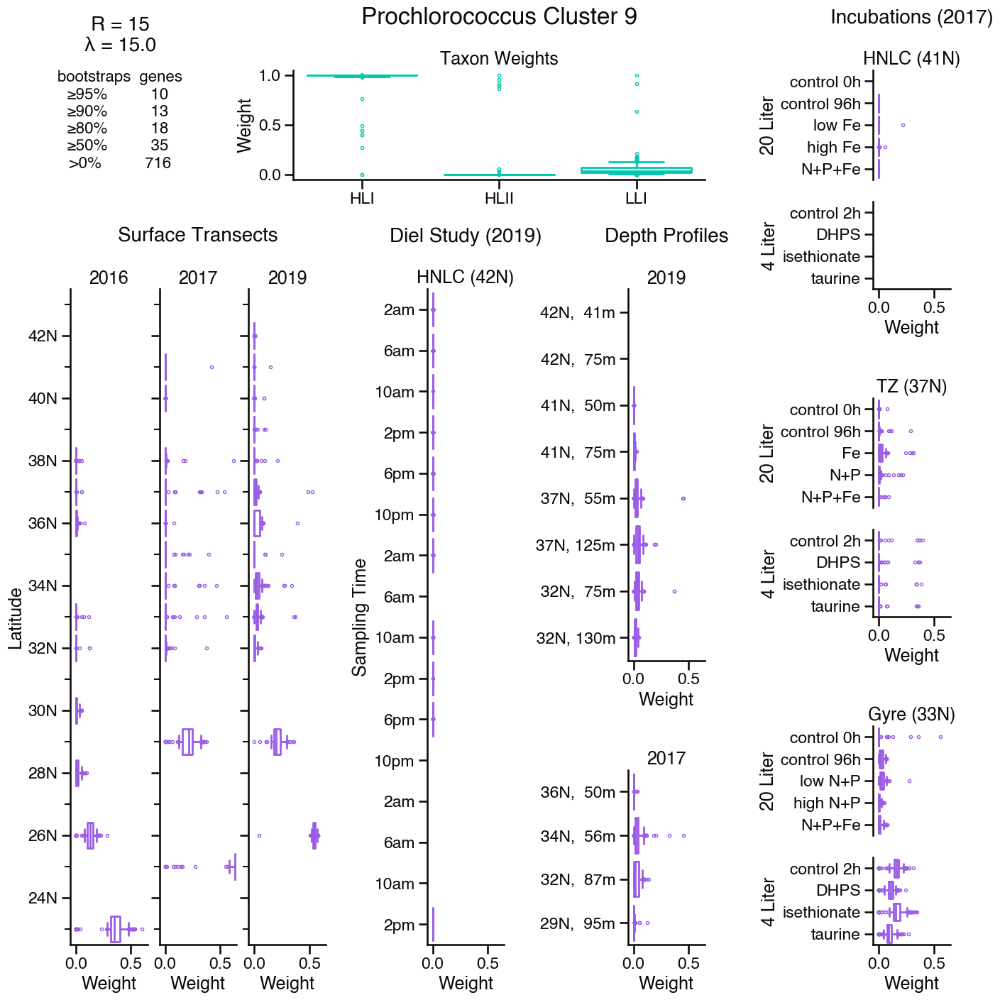

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60004522,0.365110,0.343380,0.956667,protein of unknown function (DUF4278)
1,60002660,0.346320,0.336913,0.950000,photosystem II oxygen-evolving enhancer protein 1
2,60000035,0.340101,0.322734,0.943333,phosphate ABC transporter substrate-binding pr...
3,60007828,0.286086,0.272021,0.960000,hypothetical protein
4,60001362,0.254069,0.232038,0.963333,Major Facilitator Superfamily protein
5,60000252,0.242145,0.227742,0.960000,hypothetical protein
6,60000197,0.242034,0.232679,0.960000,pyruvate dehydrogenase E2 component (dihydroli...
7,60000280,0.241107,0.213811,0.923333,Protein of unknown function (DUF3155)
8,60003282,0.177806,0.165735,0.960000,hypothetical protein
9,60007541,0.172832,0.170052,0.963333,hypothetical protein


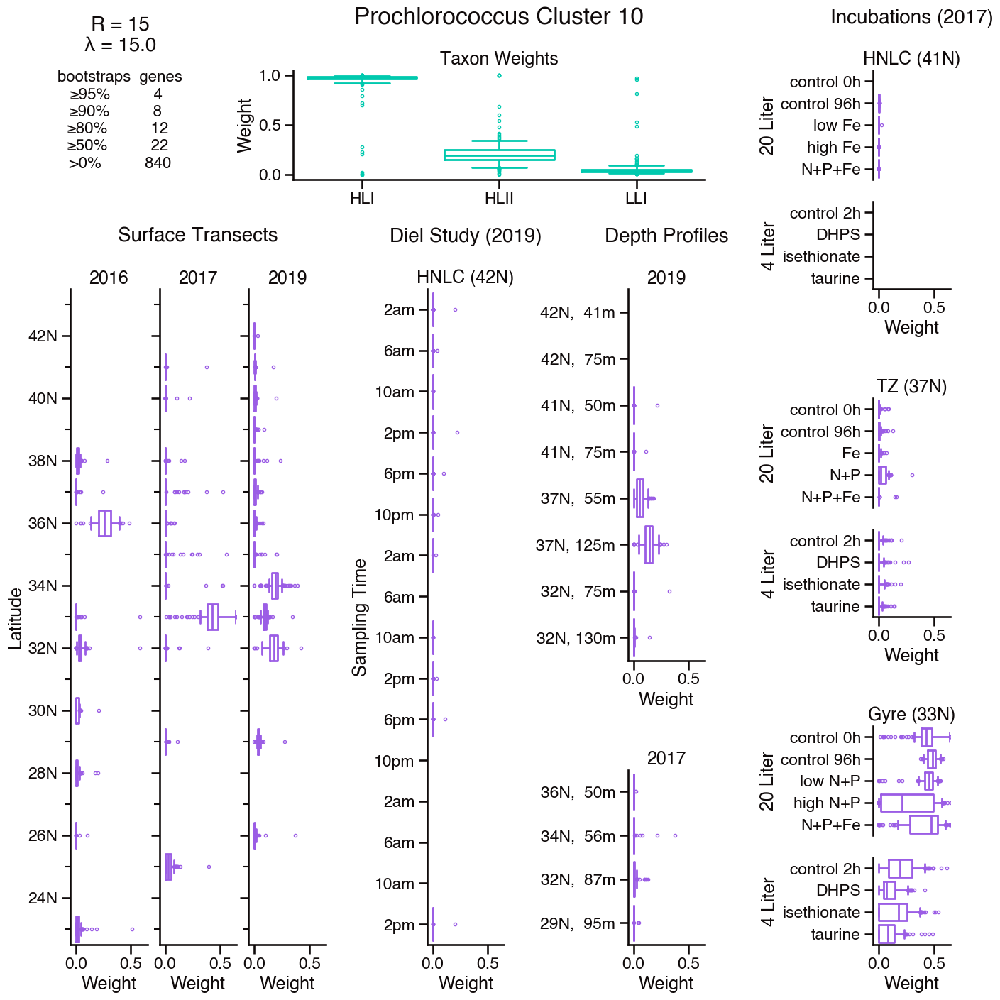

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60001812,0.398015,0.371168,0.960000,hypothetical protein
1,60000034,0.395519,0.359059,0.903333,hypothetical protein
2,60001613,0.350113,0.329815,0.953333,hypothetical protein
3,60001855,0.334181,0.313212,0.950000,hypothetical protein
4,60001584,0.320832,0.300131,0.953333,hypothetical protein
5,60001044,0.319735,0.298284,0.946667,hypothetical protein
6,60001258,0.229058,0.210793,0.913333,hypothetical protein
7,60000403,0.199027,0.188161,0.940000,cysteine synthase
8,60001452,0.105875,0.101784,0.886667,hypothetical protein
9,60000285,0.093964,0.083016,0.820000,hypothetical protein


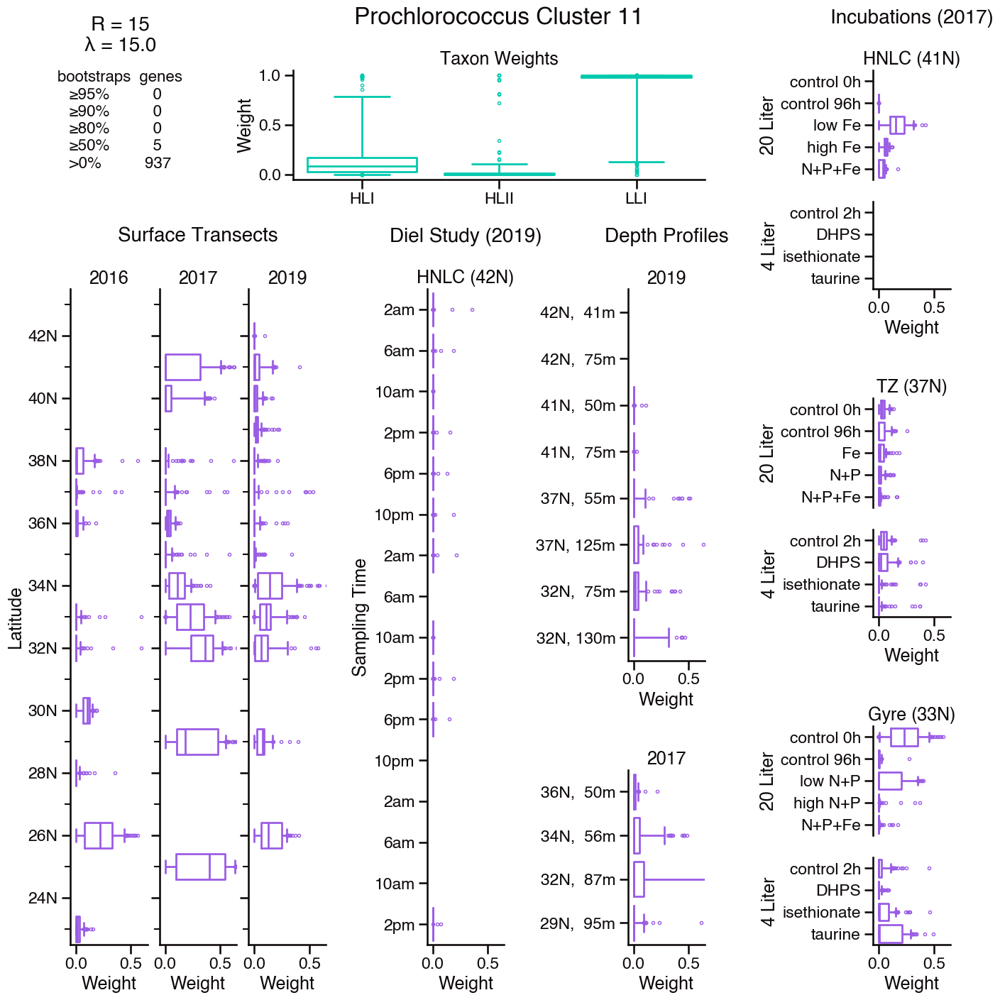

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60039089,0.508396,0.440336,0.710000,hypothetical protein
1,60002365,0.476925,0.376996,0.733333,hypothetical protein
2,60002595,0.250441,0.228990,0.623333,hypothetical protein
3,60001501,0.168785,0.184547,0.736667,ribosomal large subunit pseudouridine synthase F
4,60001259,0.096843,0.123062,0.660000,Tetratricopeptide repeat-containing protein


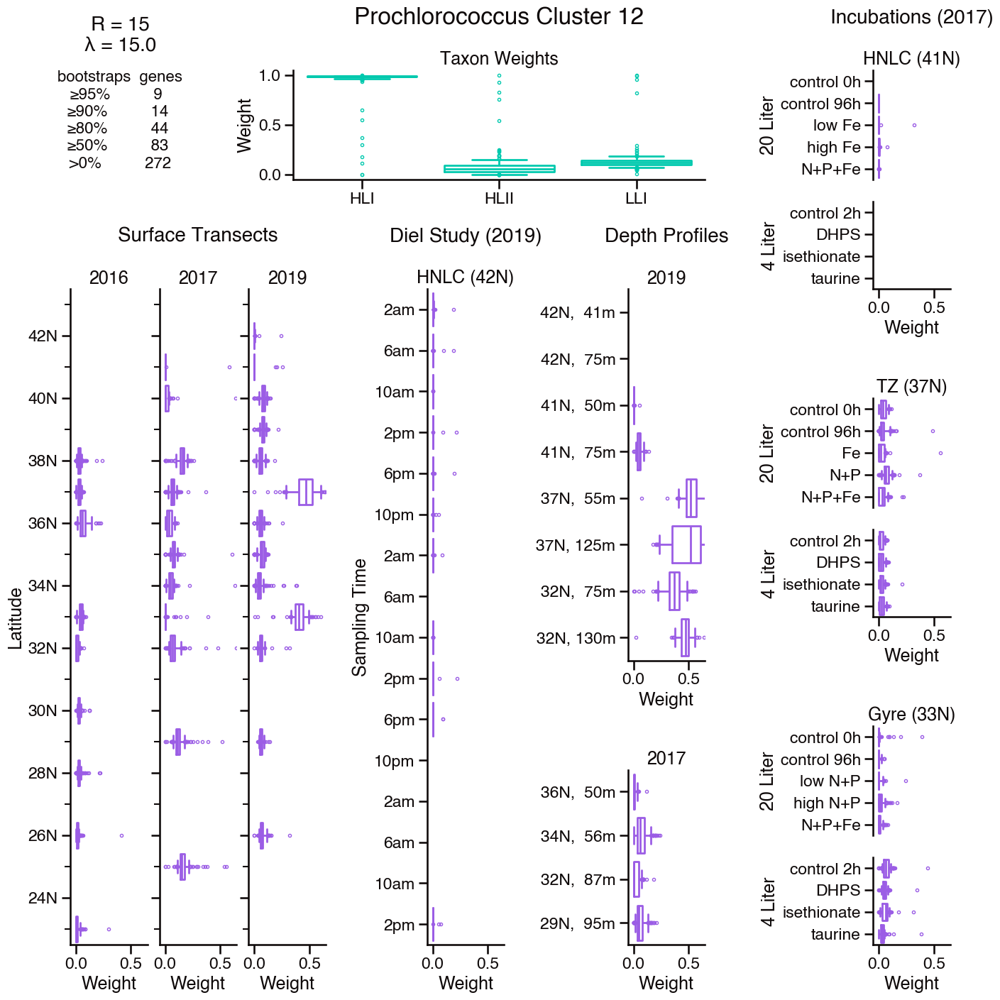

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60000650,0.227086,0.205142,0.953333,photosystem I subunit 3
1,60001287,0.221708,0.217620,0.883333,fructose-bisphosphate aldolase
2,60000004,0.218348,0.205847,0.950000,hypothetical protein
3,60000242,0.207671,0.191512,0.920000,polyribonucleotide nucleotidyltransferase
4,60001181,0.200449,0.196898,0.976667,photosystem II oxygen-evolving enhancer protein 1
5,60000288,0.195959,0.173564,0.953333,photosystem II CP47 chlorophyll apoprotein
6,60000049,0.195617,0.189259,0.966667,translation elongation factor 2 (EF-2/EF-G)
7,60000507,0.186592,0.168934,0.906667,ATP synthase F1 subcomplex alpha subunit
8,60000050,0.183879,0.178726,0.896667,"sulfate permease, SulP family"
9,60001228,0.176296,0.155147,0.960000,Pentapeptide repeat-containing protein


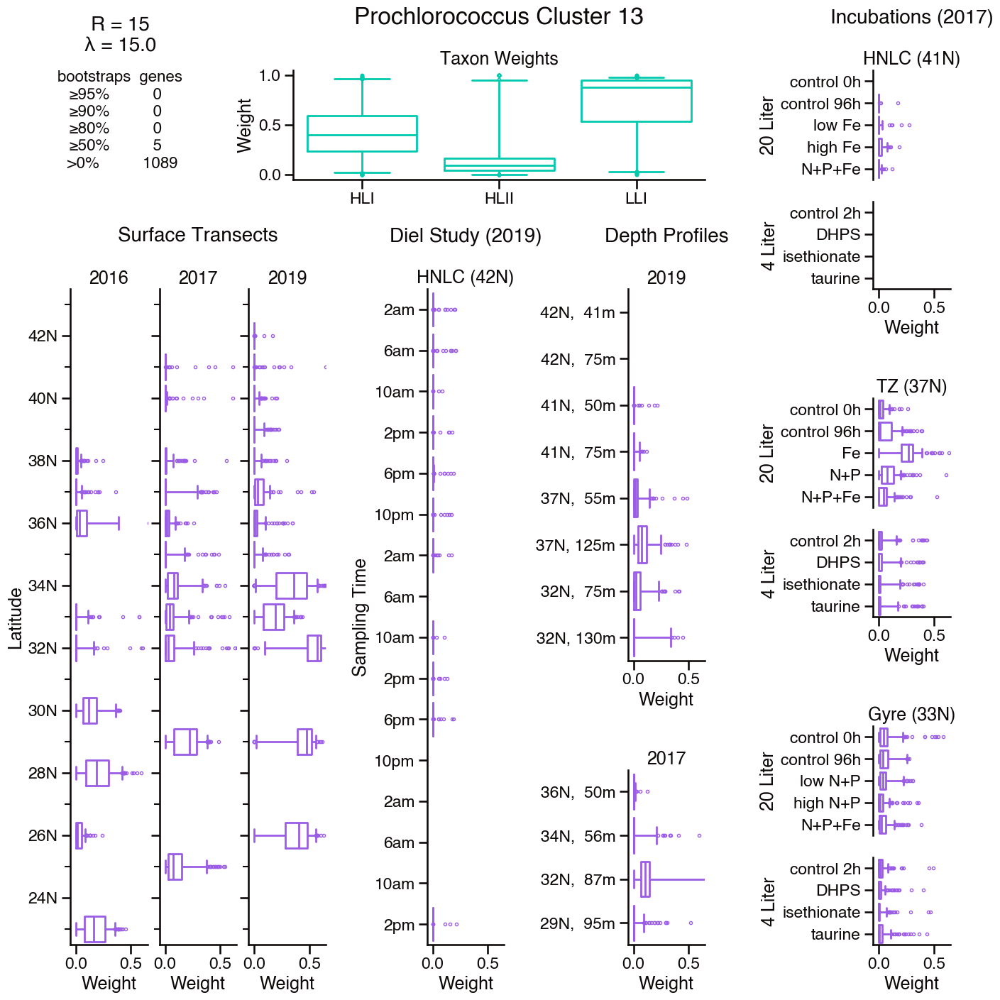

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60001535,0.551997,0.436267,0.746667,protein of unknown function (DUF4278)
1,60004522,0.370418,0.294006,0.690000,protein of unknown function (DUF4278)
2,60001258,0.249442,0.224765,0.663333,hypothetical protein
3,60001931,0.034197,0.121456,0.566667,hypothetical protein
4,60000595,0.001246,0.101450,0.500000,transaldolase


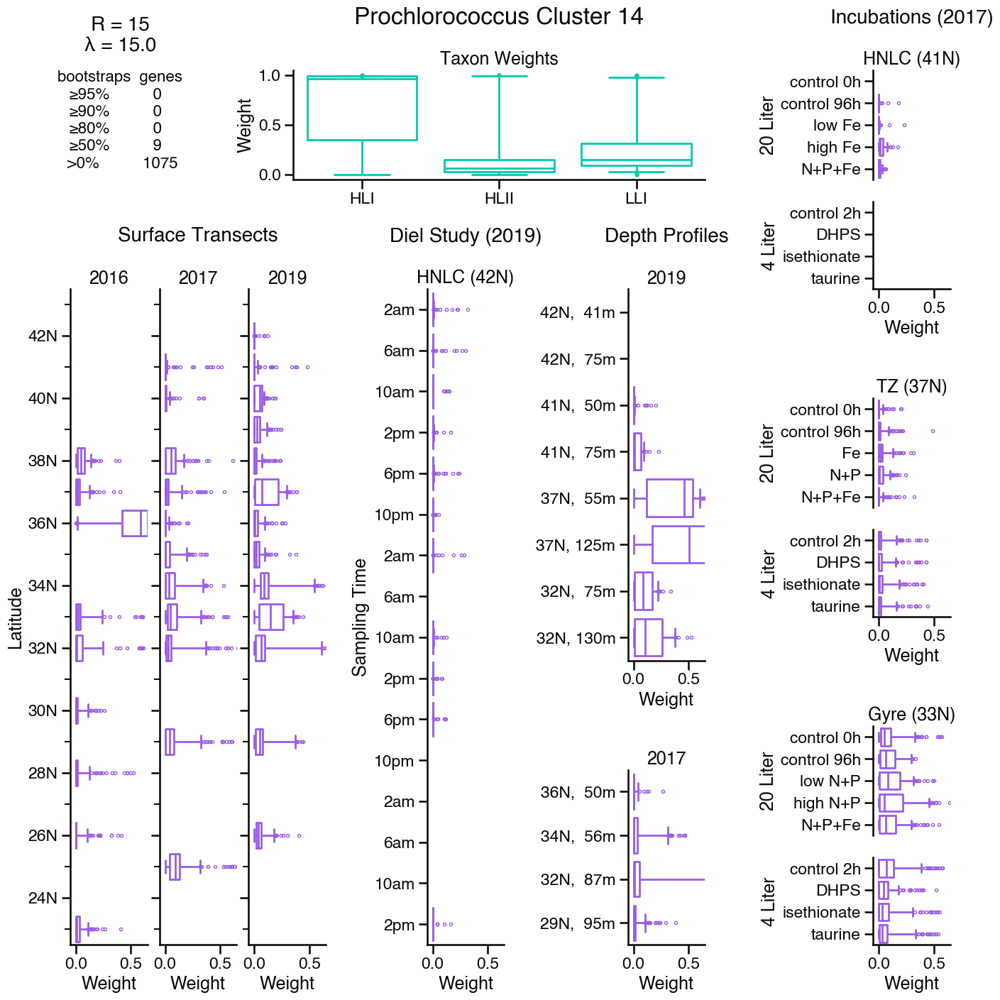

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60000459,0.202346,0.186705,0.673333,membrane protease FtsH catalytic subunit
1,60000285,0.163906,0.153028,0.623333,hypothetical protein
2,60000123,0.161020,0.161850,0.593333,molecular chaperone DnaK
3,60000002,0.146453,0.141439,0.613333,ATP-dependent Clp protease ATP-binding subunit...
4,60000403,0.127789,0.128486,0.610000,cysteine synthase
5,60000005,0.123136,0.149196,0.560000,chaperonin GroEL
6,60000027,0.072703,0.120074,0.566667,hypothetical protein
7,60000140,0.042010,0.057683,0.553333,ribonuclease J
8,60000157,0.028175,0.089315,0.510000,adenosylhomocysteinase


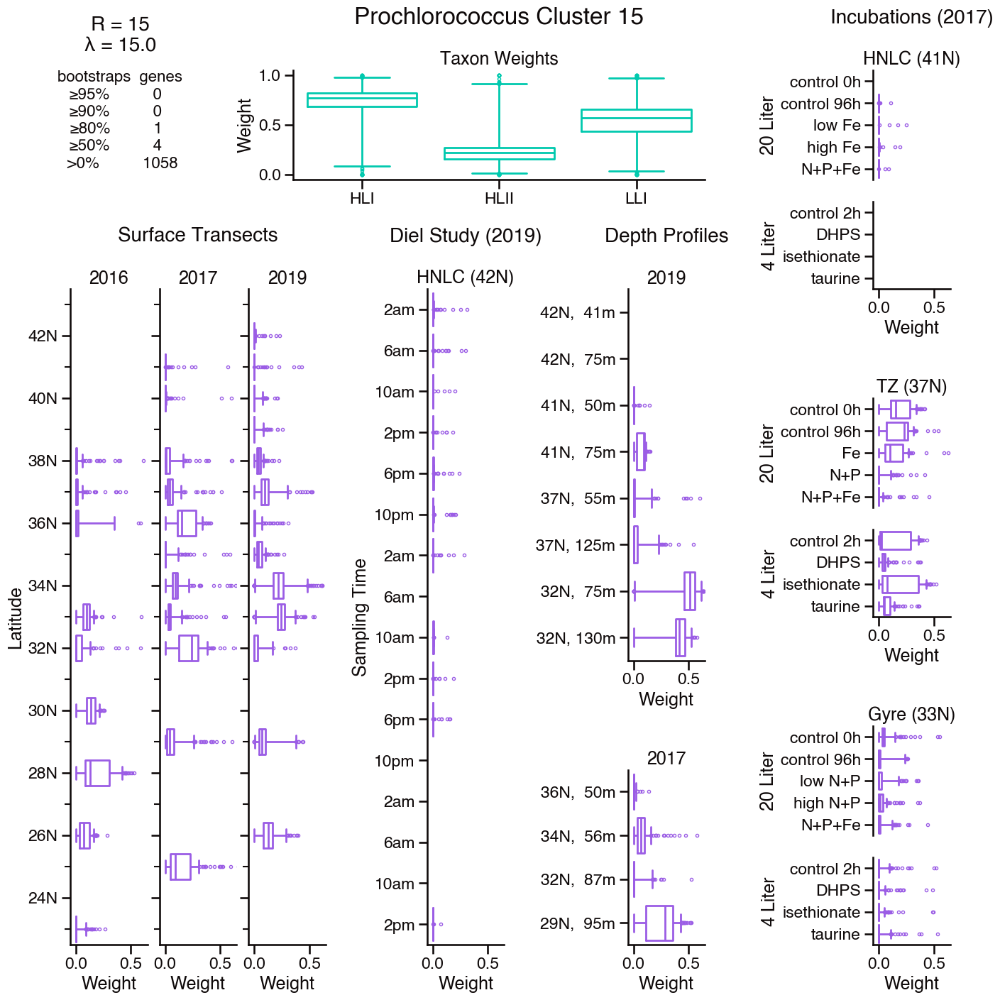

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60001296,0.823716,0.601557,0.776667,urea-binding protein
1,60000113,0.412721,0.344249,0.810000,ammonium transporter
2,60004671,0.041048,0.101820,0.580000,taurine transport system substrate-binding pro...
3,60001300,0.005932,0.060326,0.513333,urea ABC transporter membrane protein


In [6]:
# plot and save Pro clusters

# data and figure specs
genus = 'pro'
ds = {'pro': pro_ds, 'syn': syn_ds}[genus]
rank = ds.Rank
lamb = ds.Lambda
rows = 40
cols = 40
clade_color = {'pro': sns.color_palette()[2], 'syn': sns.color_palette()[3]}[genus]
sample_color = sns.color_palette()[0]
annot_kwgs = {
    'xycoords': 'axes fraction', 'va': 'center', 'ha': 'left', 'fontsize': 22, 'annotation_clip': False
}
sample_weight_range = (-0.05, 0.65)

# datapath
outdir = datapath / f'6-clusters/{genus}'
if not outdir.is_dir():
    outdir.mkdir(parents=True)
    
# iterate through clusters
for cluster in ds.Component.to_series():
    
    # set up data
    sampleweight_df = pd.merge(
        left=ds.SampleWeight.sel(Component=cluster).to_series().reset_index(), 
        right=metadata_df, 
        on='SampleName', 
        how='outer'
    )
    taxonweight_df = ds.TaxonWeight.sel(Component=cluster).to_series().reset_index()
    taxonweight_df['Clade'] = taxonweight_df['Clade'].map(clade_display_names)
    geneweight_df = ds.GeneWeight.sel(Component=cluster).to_series().reset_index()
    geneweight_df['Nonzero'] = (geneweight_df.GeneWeight != 0.)
    geneweight_df = geneweight_df.groupby('Ortholog').agg(
        MedianWeight=('GeneWeight', 'median'), 
        MeanWeight=('GeneWeight', 'mean'), 
        BootstrapSupport=('Nonzero', 'mean')
    ).reset_index()
    geneweight_df = pd.merge(
        geneweight_df[geneweight_df['BootstrapSupport'].gt(0.)], ds.Annotation.to_series(), on='Ortholog', how='left'
    ).sort_values(['MedianWeight', 'BootstrapSupport'], ascending=False, key=abs).reset_index(drop=True)

    # set up figure
    fig = plt.figure(figsize=(16, 16))
    grid = plt.GridSpec(rows, cols, wspace=1.2, hspace=0)
    
    # annotate with gene information
    axis = plt.subplot(grid[:5, :8])
    axis.set_axis_off()
    axis.annotate(
        'R = {}\nλ = {}'.format(rank, lamb), 
        xy=(0.3, 1.5), xycoords='axes fraction', va='top', ha='center', fontsize=20
    )
    boot_stats = geneweight_df['BootstrapSupport']
    axis.annotate(
        'bootstraps  genes\n{:^13}{:^12}\n{:^13}{:^12}\n{:^13}{:^12}\n{:^13}{:^12}\n{:^14}{:^12}'.format(
            '≥95%', boot_stats.ge(0.95).sum(), '≥90%', boot_stats.ge(0.9).sum(), '≥80%', boot_stats.ge(0.8).sum(), 
            '≥50%', boot_stats.ge(0.5).sum(), '>0%', boot_stats.gt(0.0).sum()), 
        xy=(0.3, 1.0), xycoords='axes fraction', va='top', ha='center', fontsize=16
    )
    
    # plot clade data
    axis = plt.subplot(grid[:5, 10:29])
    axis.annotate('{} Cluster {}'.format({'pro': 'Prochlorococcus', 'syn': 'Synechococcus'}[genus], cluster), 
                  xy=(0.5, 1.48), xycoords='axes fraction', va='center', ha='center', fontsize=24)
    plot_df = taxonweight_df
    sns.boxplot(
        data=plot_df, x='Clade', y='TaxonWeight', color=clade_color, order=list(clade_display_names.values())[:3], 
        fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
    )
    axis.set(title='Taxon Weights', xlabel='', ylabel='Weight', ylim=(-0.05, 1.05))
    
    # plot surface transect data
    n_bins = 21
    bounds = (23, 43)
    for i, year in enumerate([2016, 2017, 2019]):
        axis = plt.subplot(grid[10:, 4*i:4*i+4])
        if i == 1:
            axis.annotate('Surface Transects', xy=(.5, 1.08), xycoords='axes fraction', va='center', ha='center', fontsize=20)
        # plot community composition
        plot_df = sampleweight_df[(sampleweight_df['Year'] == year) & (sampleweight_df['SampleGroup'] == 'surface transect')]
        latitudes = plot_df[
            ['SampleName', 'Latitude']].drop_duplicates().set_index('SampleName').sort_values('Latitude')['Latitude']
        lat_bins = unique_bins(latitudes, n_bins, bounds=bounds, reverse=False)
        plot_df['lat_idx'] = plot_df['SampleName'].map(dict(zip(latitudes.index, lat_bins)))
        sns.boxplot(
            data=plot_df, x='SampleWeight', y='lat_idx', color=sample_color, order=np.arange(n_bins), 
            orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
        )
        if not i:
            axis.set_yticks(np.arange(1, n_bins, 2), [f'{l}N' for l in np.arange(bounds[0]+1, bounds[1], 2)])
            axis.set(xlabel='Weight', ylabel='Latitude', xlim=sample_weight_range, ylim=(-0.5, n_bins-0.5), title=year)
        else: 
            axis.set_yticks(np.arange(1, n_bins, 2))
            axis.tick_params(labelleft=False)
            axis.set(xlabel='Weight', ylabel='', xlim=sample_weight_range, ylim=(-0.5, n_bins-0.5), title=year)
        axis.set_yticks(np.arange(n_bins), minor=True)
    
    # plot diel data
    axis = plt.subplot(grid[10:, 16:20])
    axis.annotate('Diel Study (2019)', xy=(0.5, 1.08), xycoords='axes fraction', va='center', ha='center', fontsize=20)
    # plot community composition
    plot_df = sampleweight_df[sampleweight_df['SampleGroup'] == 'diel study'].sort_values('Datetime', ascending=False)
    n_samples = plot_df['SampleName'].nunique()
    plot_df['idx'] = plot_df['SampleName'].map(dict(zip(plot_df['SampleName'].unique(), np.arange(n_samples))))
    sns.boxplot(
        data=plot_df, x='SampleWeight', y='idx', color=sample_color, 
        orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
    )
    axis.set(xlabel='Weight', ylabel='Sampling Time', xlim=sample_weight_range, ylim=(-0.5, n_samples-0.5), title='HNLC (42N)')
    axis.set_yticks(np.arange(n_samples), plot_df[['SampleName', 'TimeClass']].drop_duplicates()['TimeClass']);
    
    # plot depth data
    for i, year in enumerate([2019, 2017]):
        axis = plt.subplot(grid[10+(i*22):27+(i*23), 25:29])
        if not i:
            axis.annotate('Depth Profiles', xy=(0.5, 1.141), xycoords='axes fraction', va='center', ha='center', fontsize=20)
        # plot community composition
        plot_df = sampleweight_df[(sampleweight_df['SampleGroup'] == 'depth profiles') & (sampleweight_df['Year'] == year)].sort_values(
            ['Latitude', 'Depth'], ascending=[True, False])
        n_samples = plot_df['SampleName'].nunique()
        plot_df['idx'] = plot_df['SampleName'].map(dict(zip(plot_df['SampleName'].unique(), np.arange(n_samples))))
        sns.boxplot(
            data=plot_df, x='SampleWeight', y='idx', color=sample_color, 
            orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
        )
        axis.set(xlabel='Weight', ylabel='', xlim=sample_weight_range, ylim=(-0.5, n_samples-0.5), title=year)
        label_df = plot_df[['SampleName', 'Depth', 'Latitude']].drop_duplicates()
        labels = [f"{int(r['Latitude'])}N,{r['Depth']:4}m" for _, r in label_df.iterrows()]
        axis.set_yticks(np.arange(n_samples), labels);
    
    # plot incubation data
    incubation_treatment_order = {
        'HNLC': {'rr': ['control 0h', 'control 96h', 'low Fe', 'high Fe', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}, 
        'TZ': {'rr': ['control 0h', 'control 96h', 'Fe', 'N+P', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}, 
        'gyre': {'rr': ['control 0h', 'control 96h', 'low N+P', 'high N+P', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}
    }
    for i, condition in enumerate(['HNLC', 'TZ', 'gyre']):
        axtop = plt.subplot(grid[15*i:5+(15*i), 36:40]) # 0:5, 15:20, 30:35
        axbottom = plt.subplot(grid[6+(15*i):10+(15*i), 36:40]) # 6:10, 21:25, 36:40
        # plot community composition
        data_df = sampleweight_df[sampleweight_df['Condition'] == condition]
        # plot resource ratio on top and sulfur amendments on bottom
        for dataset in ['rr', 'bryn']:
            axis = {'rr': axtop, 'bryn': axbottom}[dataset]
            if dataset == 'rr':
                plot_df = data_df[data_df['Dataset'] != 'Bryn amendment incubation']
                # label dataset
                if not i:
                    axis.annotate('Incubations (2017)', xy=(0.5, 1.48), xycoords='axes fraction', 
                                  va='center', ha='center', fontsize=20)
            elif dataset == 'bryn': 
                plot_df = data_df[data_df['Dataset'] == 'Bryn amendment incubation']
            plot_df['Treatment'] = pd.Categorical(plot_df['Treatment'], incubation_treatment_order[condition][dataset])
            # get around empty datasets with a hackey solution
            if plot_df.SampleWeight.isna().all():
                sns.barplot(
                    data=plot_df.sort_values('Treatment'), x='SampleWeight', y='Treatment', color=sample_color, 
                    orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
                )
            else:
                sns.boxplot(
                    data=plot_df.sort_values('Treatment'), x='SampleWeight', y='Treatment', color=sample_color, 
                    orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
                )
            if dataset == 'rr':
                axis.set(xlabel='', ylabel='20 Liter', xlim=sample_weight_range, 
                         title={'HNLC': 'HNLC (41N)', 'TZ': 'TZ (37N)', 'gyre': 'Gyre (33N)'}[condition])
                axis.spines[['bottom']].set_visible(False)
                axis.tick_params(bottom=False, labelbottom=False)
            elif dataset == 'bryn':
                axis.set(xlabel='Weight', ylabel='4 Liter', xlim=sample_weight_range)
    
    # save/show figure
    fig.savefig(outdir / '{}{}-cluster-profile.png'.format(genus, cluster), bbox_inches='tight')
    plt.show()

    # save/show gene weights
    geneweight_df.to_csv(outdir / '{}{}-gene-weights.csv'.format(genus, cluster), index=False)
    display(geneweight_df[geneweight_df.MedianWeight != 0.].head(20))


# _Synechococcus_ clusters

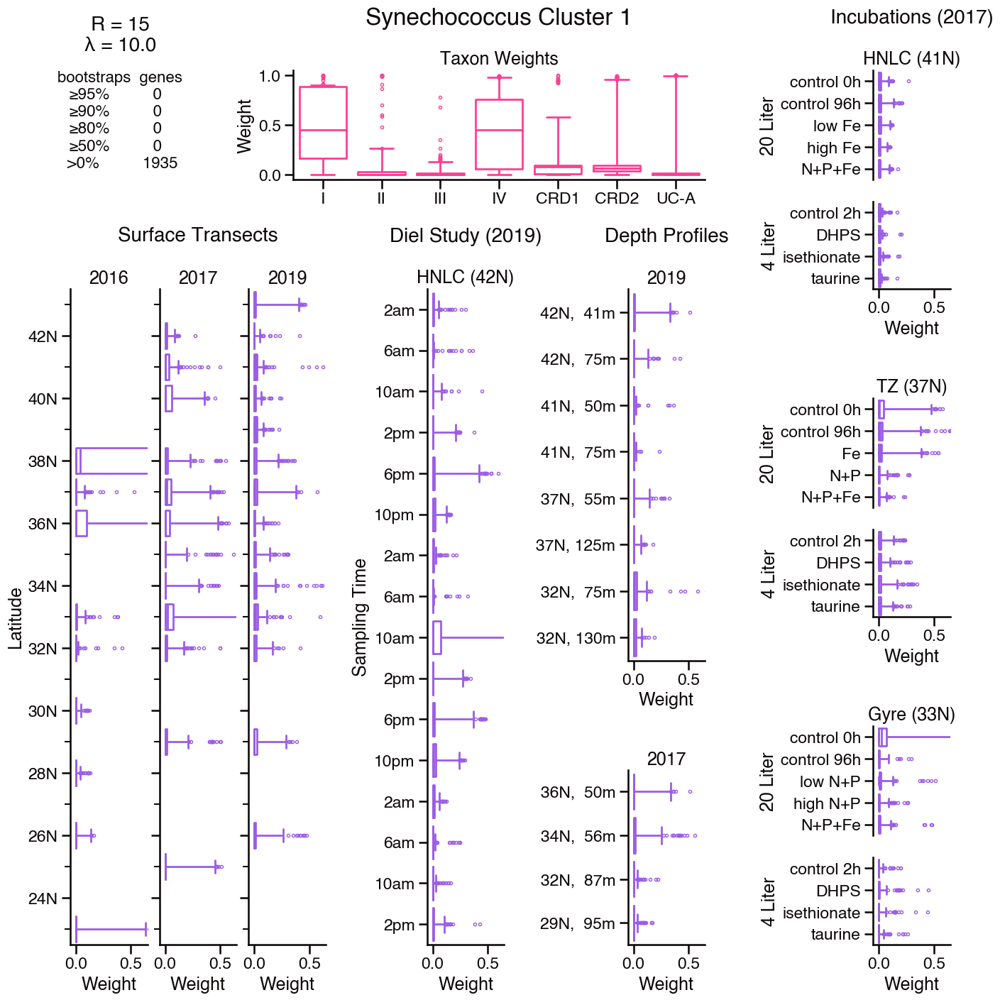

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation


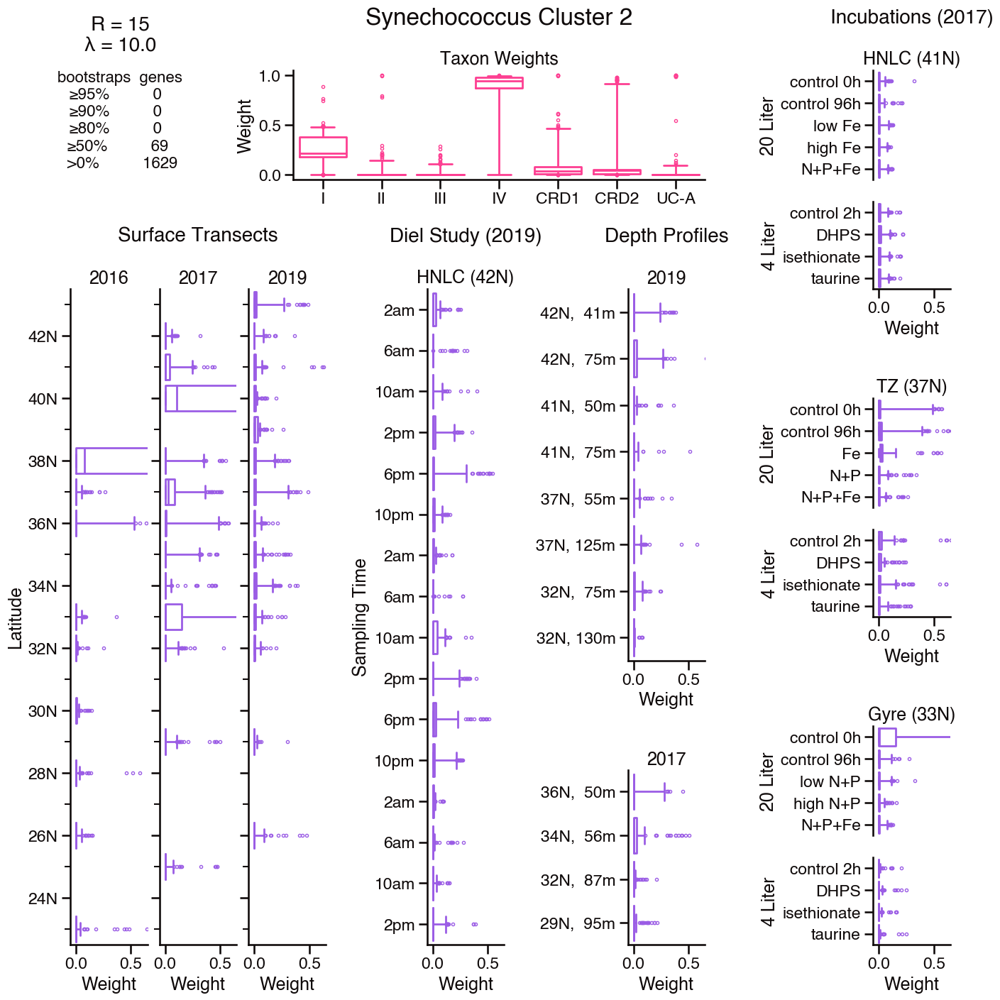

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60002099,0.051759,0.038315,0.540000,"DNA-binding response regulator, NarL/FixJ fami..."
1,60004226,0.040671,0.035952,0.546667,Alternative oxidase
2,60001465,0.040495,0.038860,0.533333,ATP-dependent helicase Lhr and Lhr-like helicase
3,60002730,0.038324,0.039541,0.526667,hypothetical protein
4,60000460,0.038288,0.031832,0.526667,Predicted component of the ribosome quality co...
5,60002175,0.036715,0.039315,0.526667,Glycosyl transferase family 2
6,60004960,0.035382,0.033453,0.526667,Glycosyl transferase family 2
7,60000292,0.034408,0.028739,0.536667,"anthranilate synthase, component I"
8,60004369,0.033961,0.034466,0.526667,Glycosyltransferase involved in cell wall bisy...
9,60002201,0.032632,0.042043,0.526667,Protein of unknown function (DUF3370)


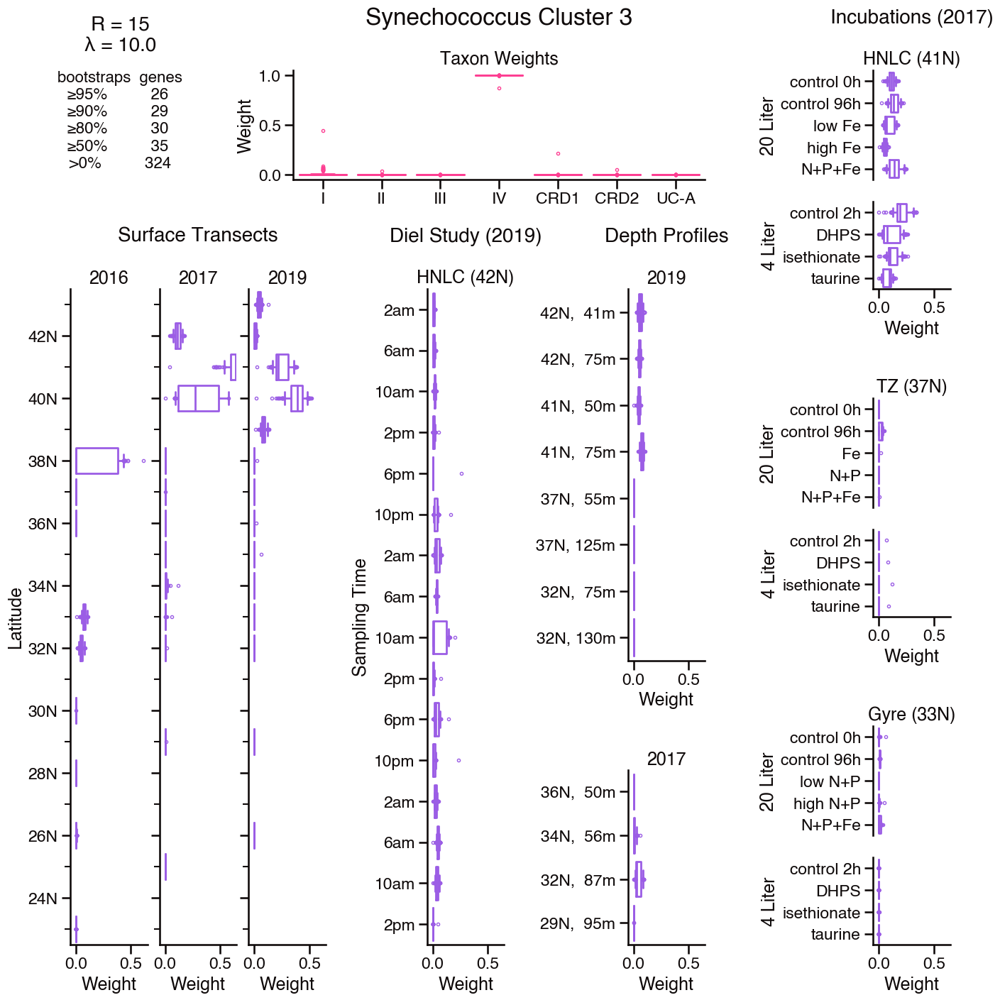

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60021198,0.315045,0.310229,0.990000,citronellol/citronellal dehydrogenase
1,60032022,0.297801,0.281027,0.990000,DNA-directed RNA polymerase subunit omega
2,60029856,0.293720,0.290570,0.996667,periplasmic chaperone for outer membrane prote...
3,60015661,0.281863,0.278472,0.996667,ribulose-5-phosphate 3-epimerase
4,60022412,0.263430,0.262824,0.996667,GTP pyrophosphokinase
5,60034122,0.237361,0.235720,0.996667,O-sialoglycoprotein endopeptidase
6,60023953,0.226346,0.224685,0.996667,RNAse PH
7,60035087,0.201581,0.196337,0.996667,LPS assembly outer membrane protein LptD (orga...
8,60029520,0.182530,0.185081,0.996667,dihydroneopterin aldolase
9,60029857,0.179097,0.179289,0.996667,Phosphotransferase enzyme family protein


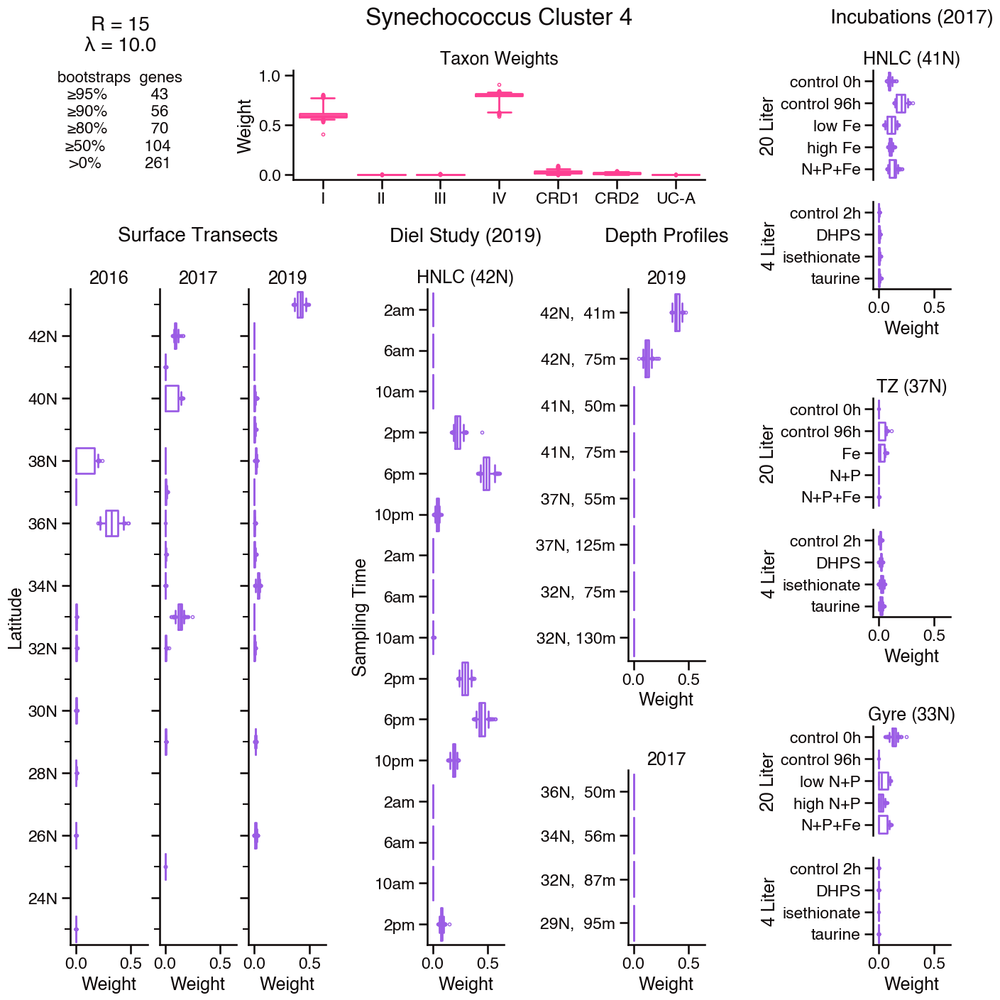

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60000835,0.368238,0.384141,0.996667,"RNA polymerase sigma factor, sigma-70 family"
1,60000067,0.332036,0.334333,1.000000,cytochrome c oxidase subunit 2
2,60000041,0.325986,0.329112,1.000000,cytochrome c oxidase subunit 1
3,60000573,0.217328,0.219336,0.996667,6-phosphogluconate dehydrogenase (decarboxylat...
4,60000143,0.212749,0.202633,1.000000,starch phosphorylase
5,60000194,0.204933,0.185662,1.000000,cytochrome c oxidase assembly protein subunit 15
6,60003215,0.202606,0.198448,0.996667,glyceraldehyde-3-phosphate dehydrogenase (NAD+)
7,60001088,0.191116,0.188657,1.000000,ferredoxin protochlorophyllide reductase subun...
8,60003132,0.187215,0.191542,1.000000,hypothetical protein
9,60000170,0.183644,0.168351,1.000000,protoheme IX farnesyltransferase


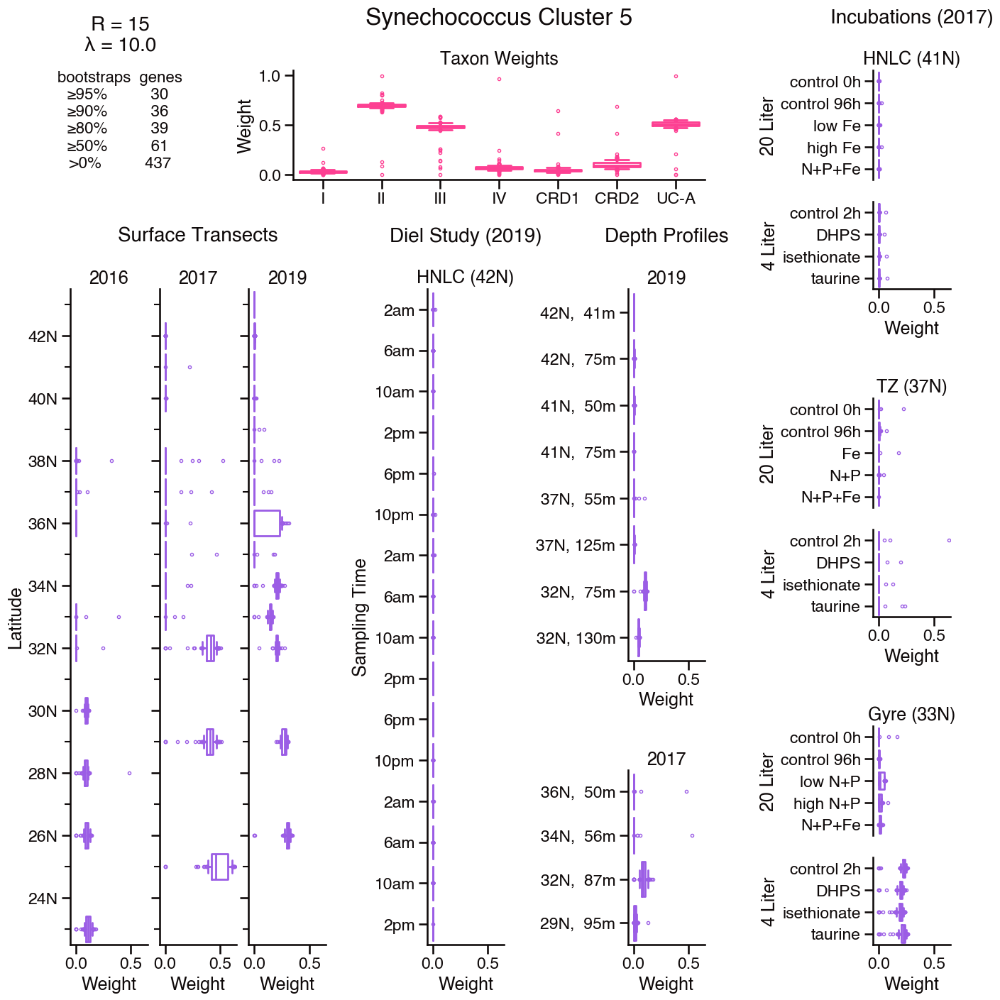

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60002292,0.672765,0.653352,0.986667,phycoerythrin-associated linker protein
1,60001652,0.394671,0.386997,0.970000,phycoerythrin alpha chain
2,60001630,0.348457,0.342931,0.986667,phycoerythrin beta chain
3,60000087,0.185976,0.185944,0.973333,photosystem I P700 chlorophyll a apoprotein A1
4,60000298,0.164105,0.158280,0.976667,AbrB-like transcriptional regulator
5,60001535,0.162676,0.153713,0.963333,protein of unknown function (DUF4278)
6,60000501,0.136083,0.124991,0.966667,photosystem I subunit 2
7,60000242,0.125570,0.124407,0.970000,polyribonucleotide nucleotidyltransferase
8,60000650,0.111433,0.112086,0.970000,photosystem I subunit 3
9,60000004,0.109760,0.105769,0.973333,hypothetical protein


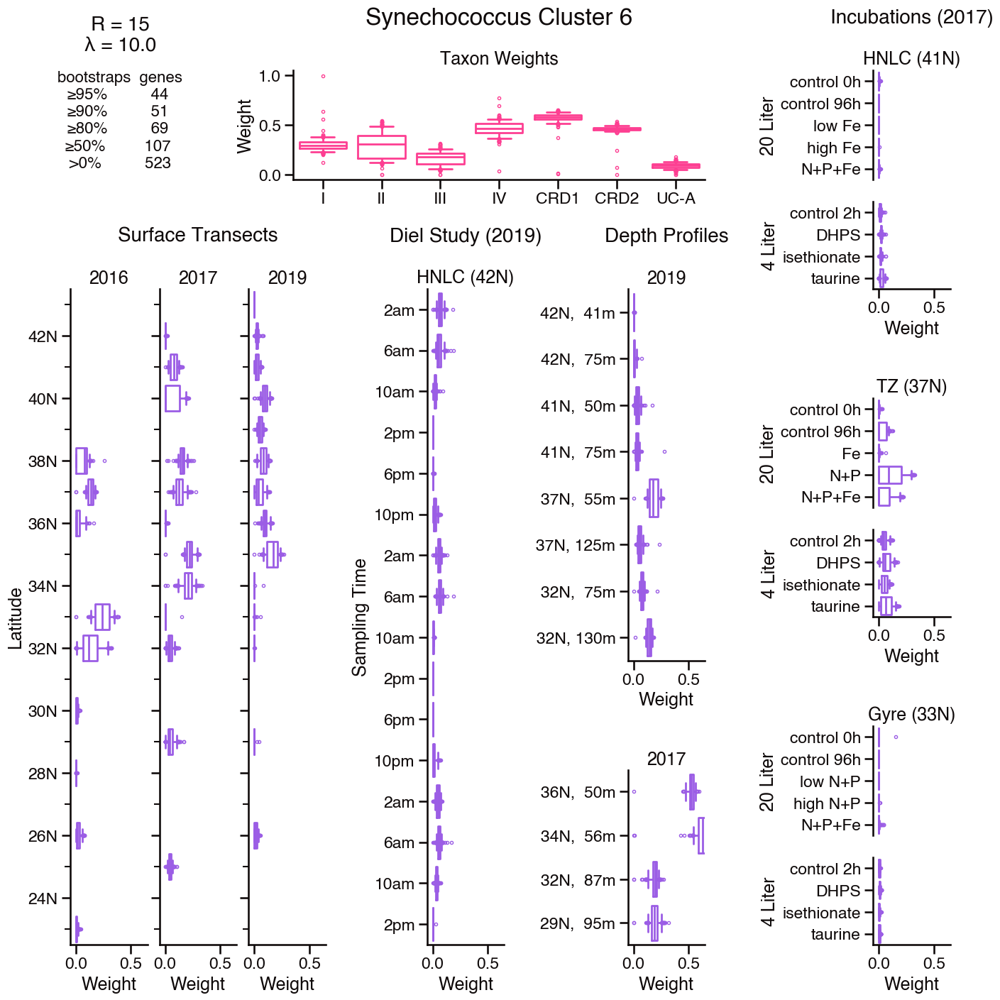

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60000978,0.289574,0.290566,0.993333,"ribulose 1,5-bisphosphate carboxylase large su..."
1,60001290,0.277692,0.231189,0.810000,fructose-bisphosphate aldolase
2,60000836,0.269927,0.266987,0.990000,"D-fructose 1,6-bisphosphatase /sedoheptulose 1..."
3,60000381,0.251222,0.219399,0.953333,glyceraldehyde 3-phosphate dehydrogenase (NADP+)
4,60000742,0.240517,0.212976,0.993333,ATP synthase F0 subcomplex B' subunit
5,60000273,0.212320,0.197172,0.986667,phosphoglycerate kinase
6,60001081,0.206634,0.206787,0.993333,"ribulose 1,5-bisphosphate carboxylase small su..."
7,60000979,0.195112,0.187476,0.993333,BMC domain-containing protein
8,60000507,0.167130,0.167475,0.993333,ATP synthase F1 subcomplex alpha subunit
9,60000811,0.164748,0.164316,0.993333,Carboxysome shell peptide mid-region


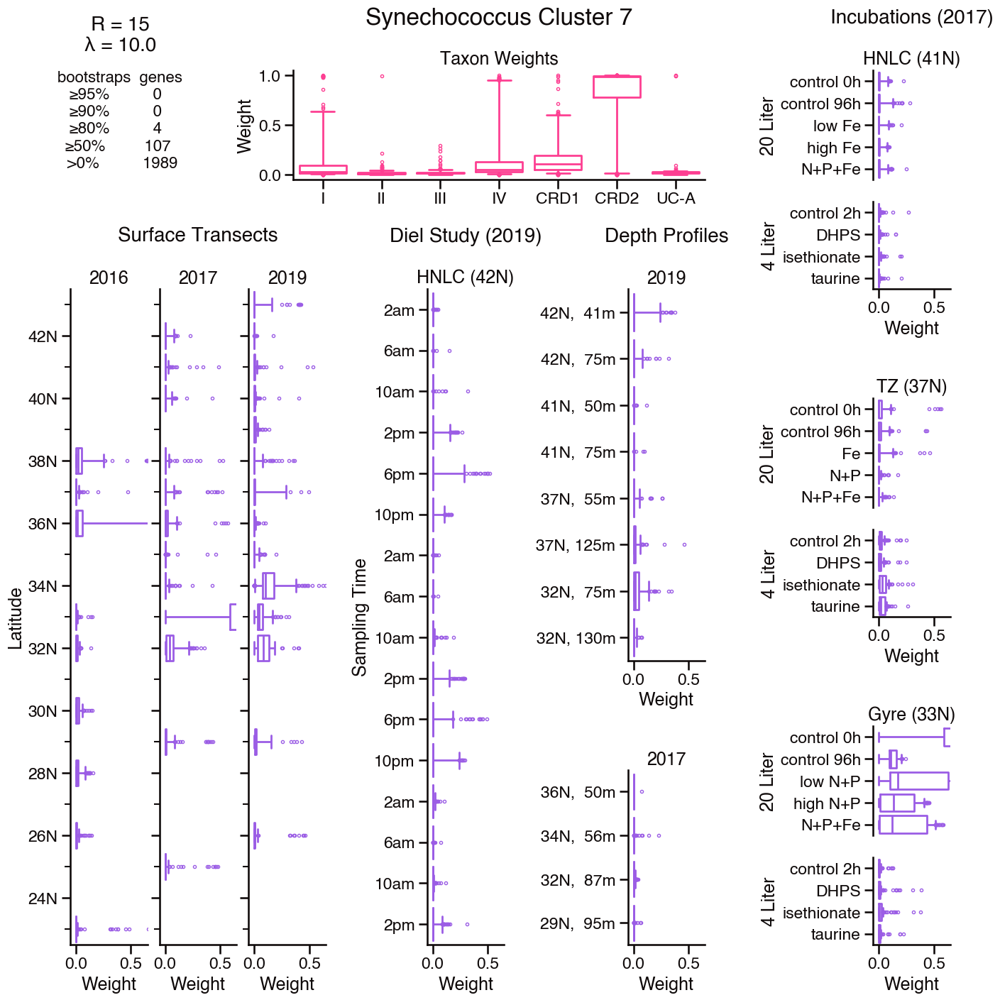

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60004205,0.171742,0.139681,0.820000,gluconolactonase
1,60004814,0.161405,0.133399,0.810000,hypothetical protein
2,60003600,0.157924,0.121767,0.750000,"Mannose or cellobiose epimerase, N-acyl-D-gluc..."
3,60004180,0.156893,0.123878,0.760000,hypothetical protein
4,60003709,0.156519,0.116369,0.736667,glycogen operon protein
5,60005614,0.152863,0.111735,0.740000,FG-GAP repeat-containing protein
6,60004700,0.139650,0.110512,0.793333,Putative intracellular protease/amidase
7,60007574,0.136036,0.102411,0.736667,Ketosteroid isomerase-related protein
8,60000573,0.129053,0.108241,0.800000,6-phosphogluconate dehydrogenase (decarboxylat...
9,60004925,0.128657,0.093753,0.736667,hypothetical protein


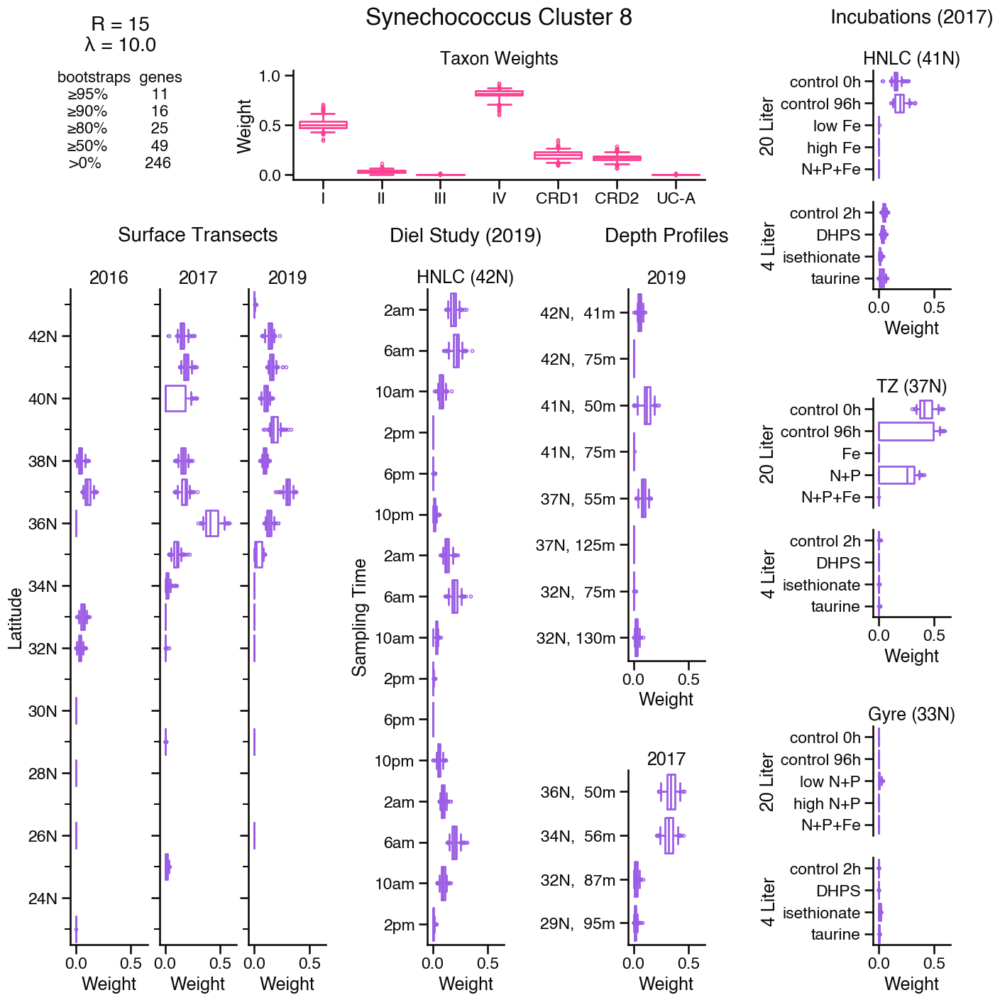

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60001112,0.562843,0.569687,0.996667,flavodoxin I
1,60000023,0.481896,0.481730,1.000000,chlorophyll a/b binding light-harvesting prote...
2,60001290,0.432237,0.408733,0.963333,fructose-bisphosphate aldolase
3,60002623,0.362676,0.359917,1.000000,hypothetical protein
4,60002950,0.105875,0.111577,0.986667,Pimeloyl-ACP methyl ester carboxylesterase
5,60000706,0.095784,0.096108,0.993333,iron(III) transport system substrate-binding p...
6,60000103,0.088662,0.085654,0.996667,thioredoxin reductase (NADPH)
7,60003170,0.085366,0.086144,0.936667,hypothetical protein
8,60000321,0.068911,0.071302,0.936667,inorganic pyrophosphatase
9,60003403,0.064012,0.071374,0.873333,"Uncharacterized membrane protein YphA, DoxX/SU..."


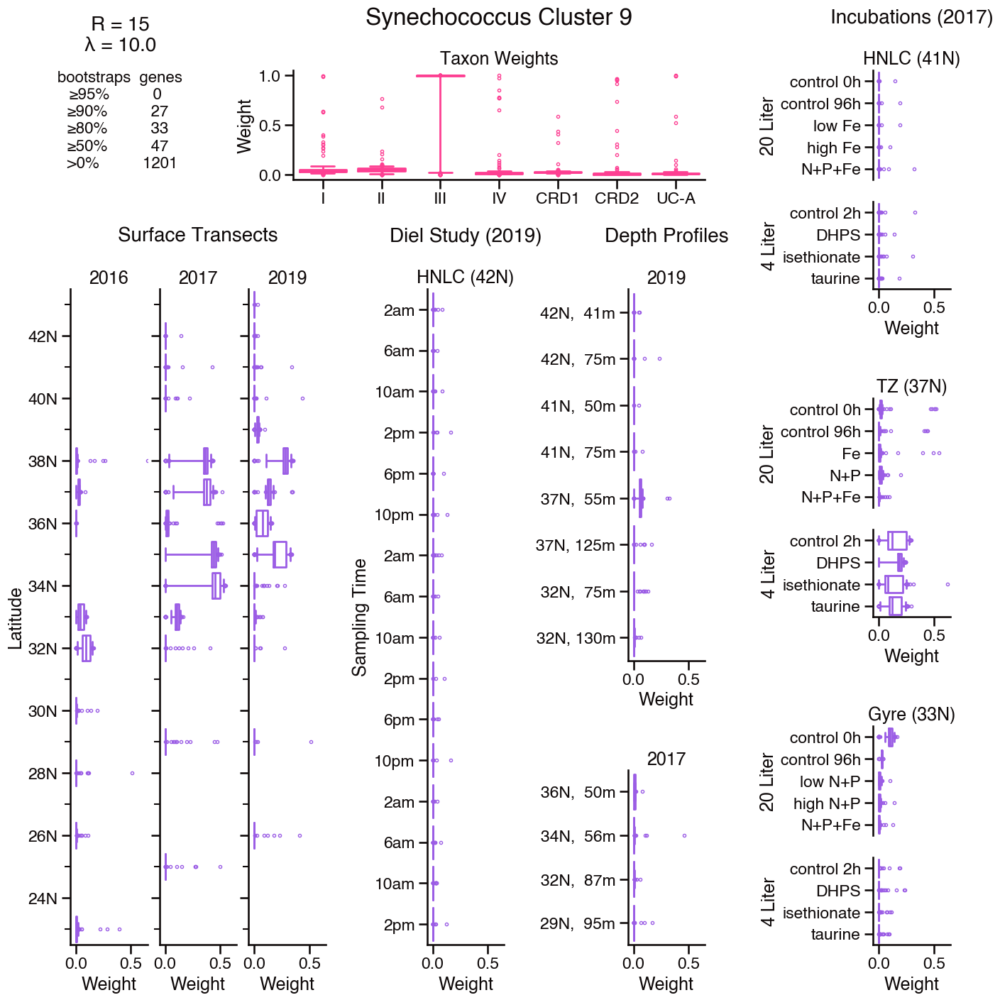

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60009898,0.388978,0.359570,0.920000,Predicted O-linked N-acetylglucosamine transfe...
1,60004866,0.357122,0.331541,0.920000,"ATP-binding cassette, subfamily B"
2,60011407,0.343561,0.318056,0.920000,Domain of unknown function (DUF4915)
3,60004369,0.274382,0.254906,0.923333,Glycosyltransferase involved in cell wall bisy...
4,60001471,0.213523,0.203678,0.920000,polysaccharide export outer membrane protein
5,60000308,0.198163,0.182425,0.920000,aspartyl-tRNA synthetase
6,60001332,0.196965,0.185093,0.920000,"GDPmannose 4,6-dehydratase"
7,60000933,0.193290,0.179794,0.920000,quinolinate synthetase
8,60003260,0.175340,0.165626,0.920000,Glycosyltransferase sugar-binding region conta...
9,60001495,0.169684,0.160969,0.920000,"NDP-sugar epimerase, includes UDP-GlcNAc-inver..."


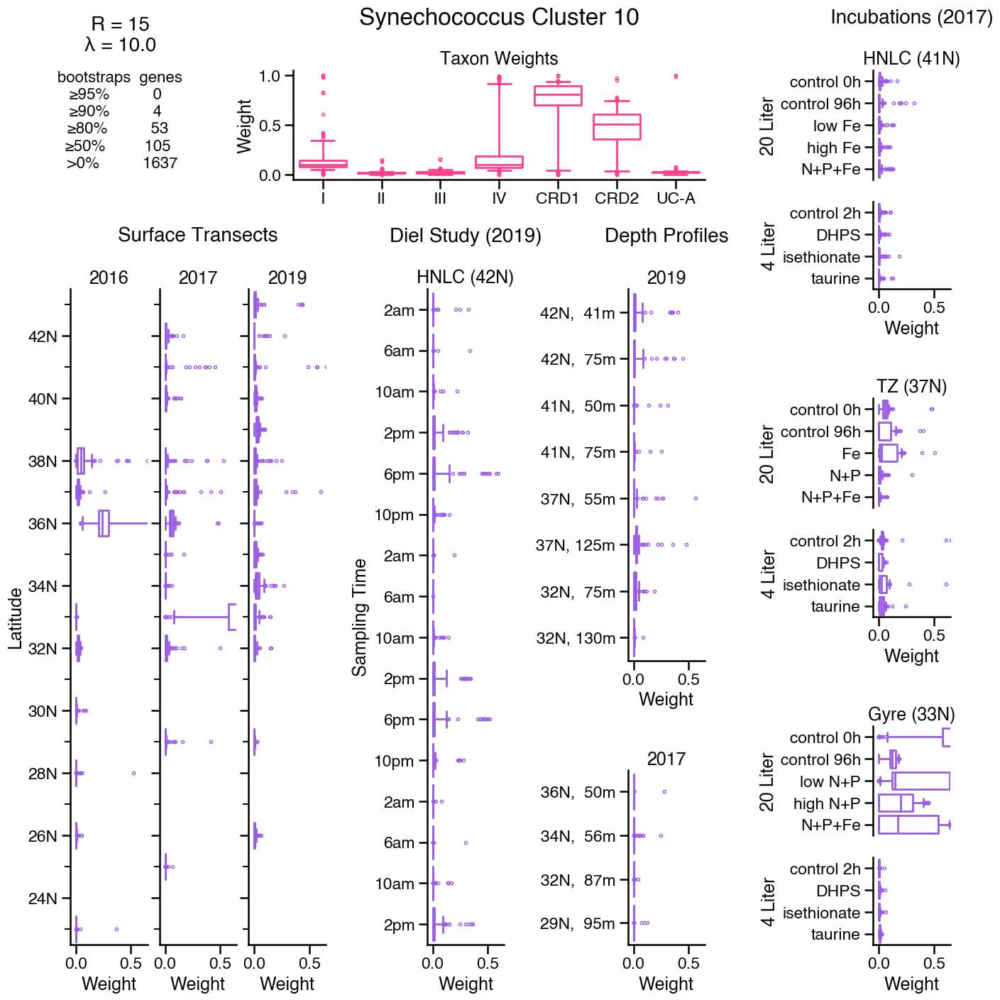

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60000041,0.248788,0.224759,0.900000,cytochrome c oxidase subunit 1
1,60000194,0.237528,0.210223,0.873333,cytochrome c oxidase assembly protein subunit 15
2,60000170,0.218269,0.194371,0.870000,protoheme IX farnesyltransferase
3,60000067,0.217797,0.191782,0.873333,cytochrome c oxidase subunit 2
4,60000835,0.211860,0.190575,0.876667,"RNA polymerase sigma factor, sigma-70 family"
5,60000247,0.208700,0.182709,0.903333,NADH dehydrogenase subunit M
6,60000077,0.194546,0.166479,0.836667,cytochrome c oxidase subunit 3
7,60000105,0.143961,0.125829,0.853333,ATP-dependent Clp protease ATP-binding subunit...
8,60000595,0.140268,0.128487,0.870000,transaldolase
9,60000143,0.139525,0.126068,0.863333,starch phosphorylase


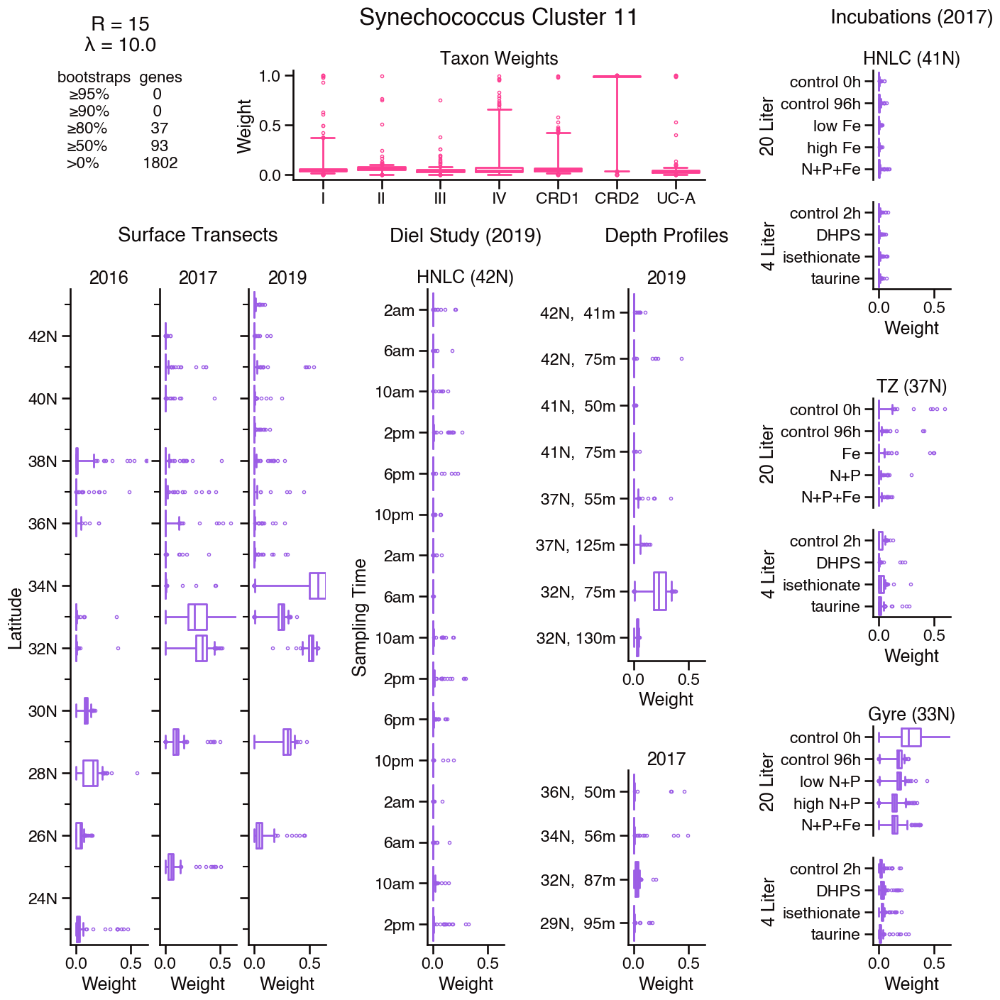

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60030679,0.304813,0.256056,0.826667,hypothetical protein
1,60004183,0.274970,0.236131,0.840000,formamidase
2,60004832,0.270320,0.233389,0.846667,hypothetical protein
3,60004204,0.212031,0.190221,0.846667,protein of unknown function (DUF4278)
4,60005716,0.201027,0.172563,0.826667,hypothetical protein
5,60005623,0.184884,0.180605,0.823333,hypothetical protein
6,60003149,0.168419,0.144087,0.836667,hypothetical protein
7,60000285,0.150516,0.143450,0.873333,hypothetical protein
8,60010252,0.145394,0.126432,0.826667,hypothetical protein
9,60000032,0.138073,0.127882,0.843333,photosystem II P680 reaction center D1 protein


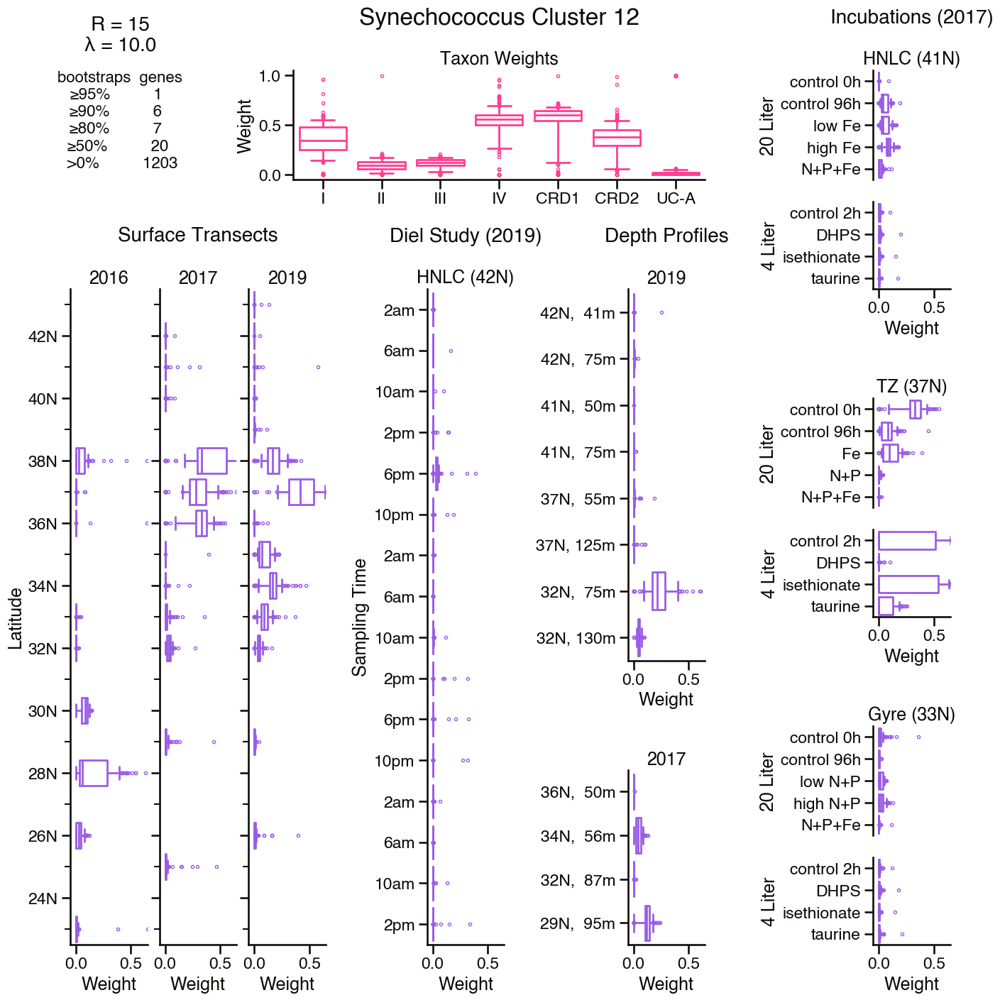

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60001296,0.585797,0.550531,0.946667,urea-binding protein
1,60001803,0.438869,0.422197,0.946667,formate/nitrite transporter
2,60001886,0.361519,0.335989,0.940000,"MFS transporter, NNP family, nitrate/nitrite t..."
3,60001979,0.315621,0.309809,0.950000,cyanate lyase
4,60000113,0.284363,0.250559,0.946667,ammonium transporter
5,60001560,0.174225,0.162646,0.936667,assimilatory nitrite reductase (ferredoxin) pr...
6,60001300,0.105539,0.113225,0.883333,urea ABC transporter membrane protein
7,60001877,0.092561,0.087229,0.790000,assimilatory nitrate reductase (ferredoxin) pr...
8,60002822,0.086955,0.075287,0.733333,glucosyl-3-phosphoglycerate synthase
9,60001295,0.051477,0.058635,0.760000,urea ABC transporter membrane protein


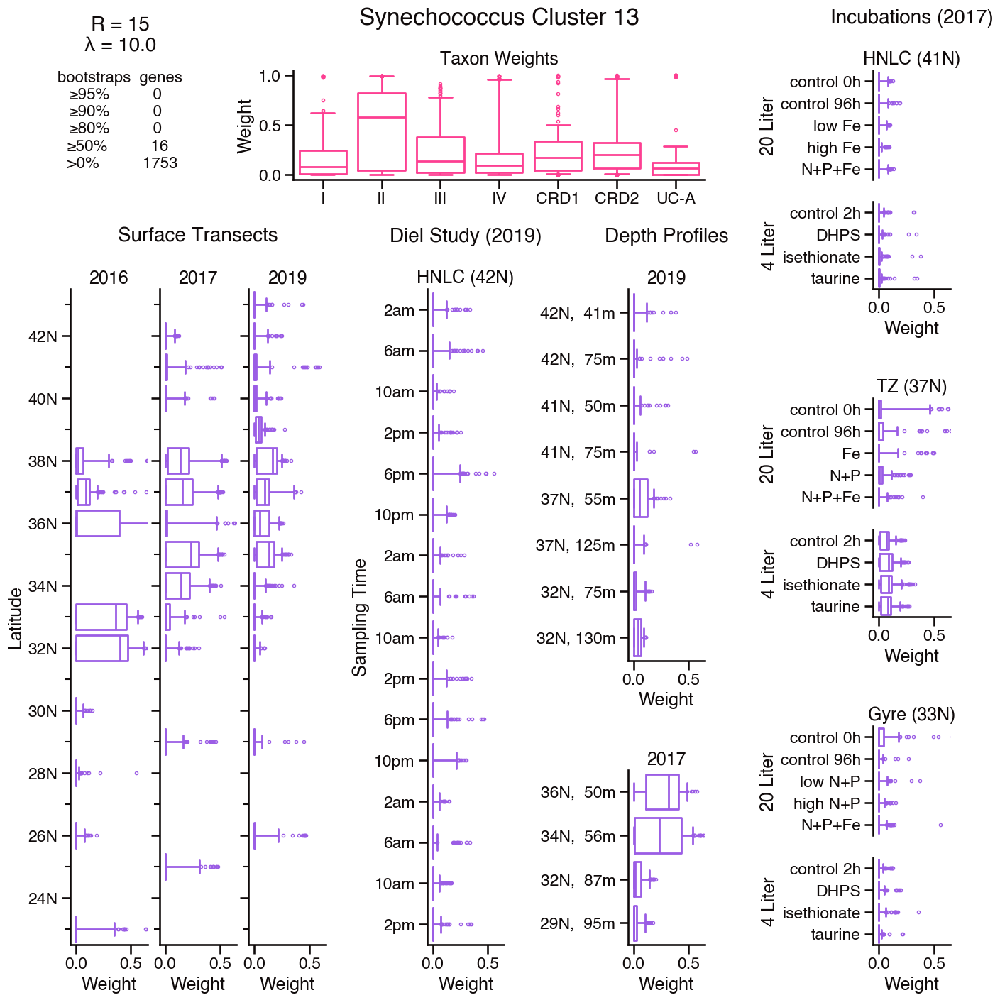

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60001290,0.326475,0.277349,0.623333,fructose-bisphosphate aldolase
1,60000624,0.133005,0.116830,0.606667,ATP synthase F0 subcomplex A subunit
2,60000381,0.112899,0.190382,0.636667,glyceraldehyde 3-phosphate dehydrogenase (NADP+)
3,60000979,0.076420,0.085071,0.573333,BMC domain-containing protein
4,60002047,0.072268,0.073343,0.573333,hydrophobe/amphiphile efflux-1 (HAE1) family p...
5,60000308,0.050614,0.074965,0.563333,aspartyl-tRNA synthetase
6,60000005,0.040463,0.079497,0.610000,chaperonin GroEL
7,60001058,0.033857,0.042403,0.623333,SSU ribosomal protein S2P
8,60000129,0.030634,0.051669,0.553333,"transcriptional regulator, GntR family"
9,60000063,0.030089,0.064802,0.580000,photosystem II P680 reaction center D2 protein


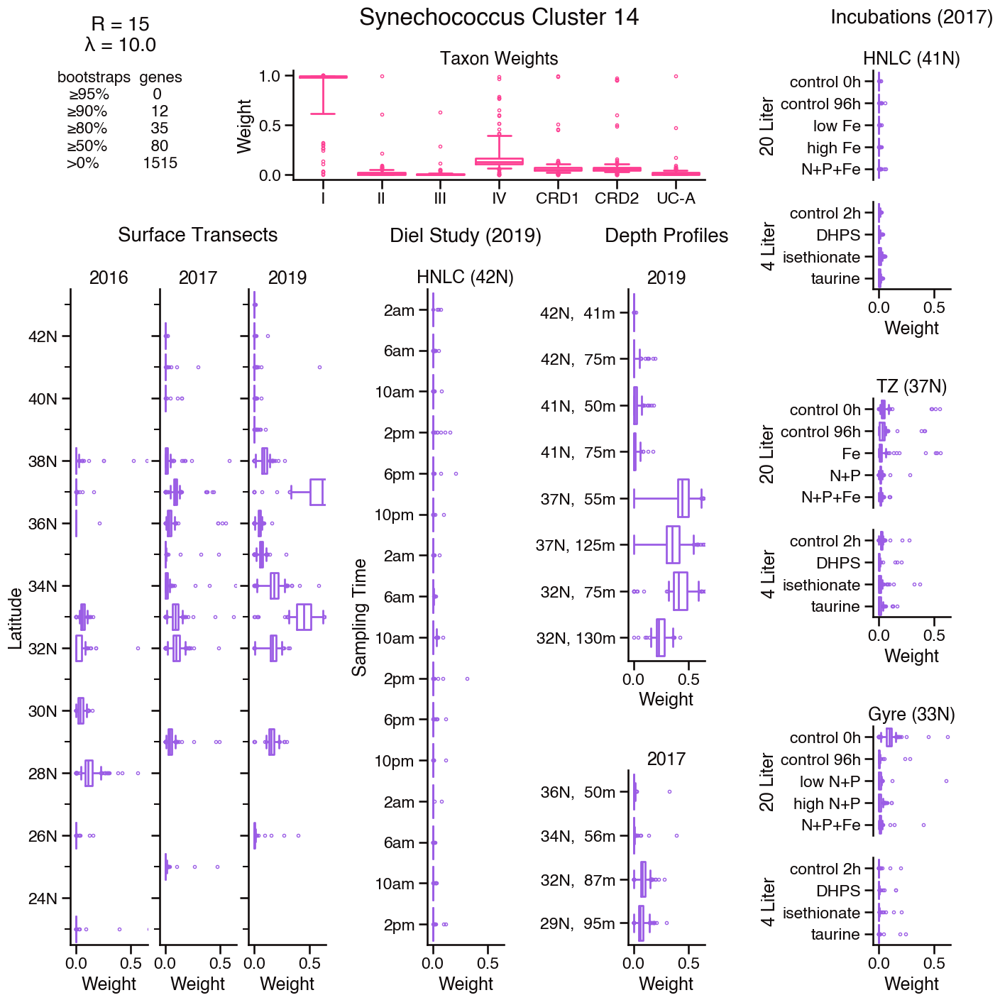

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60001007,0.390012,0.377284,0.930000,Ferritin
1,60001666,0.342825,0.324213,0.940000,ATP synthase protein I
2,60000624,0.312980,0.289877,0.930000,ATP synthase F0 subcomplex A subunit
3,60002711,0.215317,0.204120,0.930000,phycobilisome core-membrane linker protein
4,60006037,0.195318,0.175867,0.926667,hypothetical protein
5,60001240,0.183528,0.164956,0.933333,hypothetical protein
6,60006409,0.173038,0.161941,0.926667,photosystem I subunit 10
7,60002794,0.145413,0.144880,0.913333,Nitrogen fixation protein of unknown function
8,60003427,0.120794,0.122951,0.893333,transport factor 2 (NTF2) domain-containing pr...
9,60002649,0.104942,0.118344,0.873333,HSP20 family protein


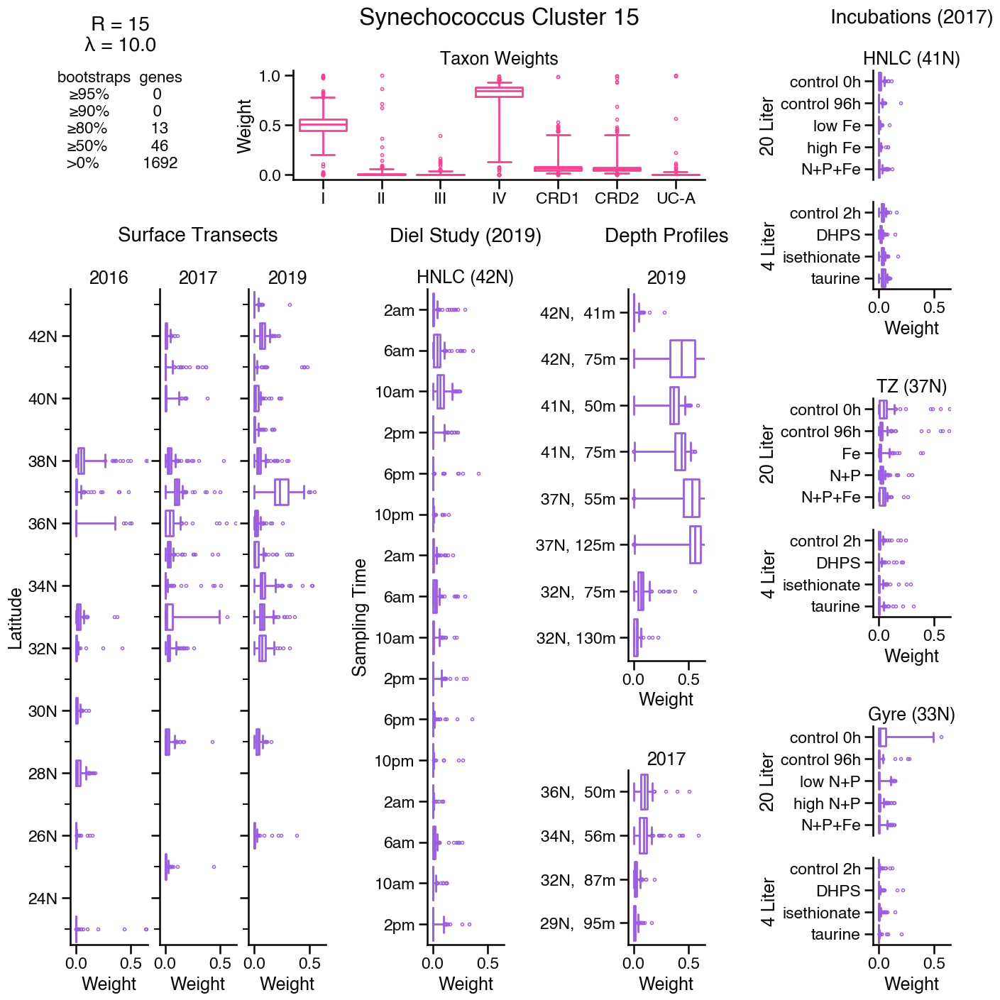

,Ortholog,MedianWeight,MeanWeight,BootstrapSupport,Annotation
0,60002794,0.455890,0.377335,0.850000,Nitrogen fixation protein of unknown function
1,60002624,0.317409,0.253111,0.826667,HEAT repeat-containing protein
2,60003153,0.259298,0.223877,0.823333,hypothetical protein
3,60001433,0.252222,0.214563,0.816667,hypothetical protein
4,60003368,0.197033,0.171129,0.846667,hypothetical protein
5,60002769,0.189139,0.166183,0.820000,hypothetical protein
6,60003427,0.186058,0.169313,0.786667,transport factor 2 (NTF2) domain-containing pr...
7,60003618,0.165344,0.144601,0.786667,nif11-like leader peptide domain-containing pr...
8,60001287,0.161878,0.138277,0.776667,fructose-bisphosphate aldolase
9,60001535,0.129641,0.134129,0.820000,protein of unknown function (DUF4278)


In [7]:
# plot and save Syn clusters

# data and figure specs
genus = 'syn'
ds = {'pro': pro_ds, 'syn': syn_ds}[genus]
rank = ds.Rank
lamb = ds.Lambda
rows = 40
cols = 40
clade_color = {'pro': sns.color_palette()[2], 'syn': sns.color_palette()[3]}[genus]
sample_color = sns.color_palette()[0]
annot_kwgs = {
    'xycoords': 'axes fraction', 'va': 'center', 'ha': 'left', 'fontsize': 22, 'annotation_clip': False
}
sample_weight_range = (-0.05, 0.65)

# datapath
outdir = datapath / f'6-clusters/{genus}'
if not outdir.is_dir():
    outdir.mkdir(parents=True)
    
# iterate through clusters
for cluster in ds.Component.to_series():
    
    # set up data
    sampleweight_df = pd.merge(
        left=ds.SampleWeight.sel(Component=cluster).to_series().reset_index(), 
        right=metadata_df, 
        on='SampleName', 
        how='left'
    )
    taxonweight_df = ds.TaxonWeight.sel(Component=cluster).to_series().reset_index()
    taxonweight_df['Clade'] = taxonweight_df['Clade'].map(clade_display_names)
    geneweight_df = ds.GeneWeight.sel(Component=cluster).to_series().reset_index()
    geneweight_df['Nonzero'] = (geneweight_df.GeneWeight != 0.)
    geneweight_df = geneweight_df.groupby('Ortholog').agg(
        MedianWeight=('GeneWeight', 'median'), 
        MeanWeight=('GeneWeight', 'mean'), 
        BootstrapSupport=('Nonzero', 'mean')
    ).reset_index()
    geneweight_df = pd.merge(
        geneweight_df[geneweight_df['BootstrapSupport'].gt(0.)], ds.Annotation.to_series(), on='Ortholog', how='left'
    ).sort_values(['MedianWeight', 'BootstrapSupport'], ascending=False, key=abs).reset_index(drop=True)

    # set up figure
    fig = plt.figure(figsize=(16, 16))
    grid = plt.GridSpec(rows, cols, wspace=1.2, hspace=0)
    
    # annotate with gene information
    axis = plt.subplot(grid[:5, :8])
    axis.set_axis_off()
    axis.annotate(
        'R = {}\nλ = {}'.format(rank, lamb), 
        xy=(0.3, 1.5), xycoords='axes fraction', va='top', ha='center', fontsize=20
    )
    boot_stats = geneweight_df['BootstrapSupport']
    axis.annotate(
        'bootstraps  genes\n{:^13}{:^12}\n{:^13}{:^12}\n{:^13}{:^12}\n{:^13}{:^12}\n{:^14}{:^12}'.format(
            '≥95%', boot_stats.ge(0.95).sum(), '≥90%', boot_stats.ge(0.9).sum(), '≥80%', boot_stats.ge(0.8).sum(), 
            '≥50%', boot_stats.ge(0.5).sum(), '>0%', boot_stats.gt(0.0).sum()), 
        xy=(0.3, 1.0), xycoords='axes fraction', va='top', ha='center', fontsize=16
    )
    
    # plot clade data
    axis = plt.subplot(grid[:5, 10:29])
    axis.annotate('{} Cluster {}'.format({'pro': 'Prochlorococcus', 'syn': 'Synechococcus'}[genus], cluster), 
                  xy=(0.5, 1.48), xycoords='axes fraction', va='center', ha='center', fontsize=24)
    plot_df = taxonweight_df
    sns.boxplot(
        data=plot_df, x='Clade', y='TaxonWeight', color=clade_color, order=list(clade_display_names.values())[3:], 
        fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
    )
    axis.set(title='Taxon Weights', xlabel='', ylabel='Weight', ylim=(-0.05, 1.05))
    
    # plot surface transect data
    n_bins = 21
    bounds = (23, 43)
    for i, year in enumerate([2016, 2017, 2019]):
        axis = plt.subplot(grid[10:, 4*i:4*i+4])
        if i == 1:
            axis.annotate('Surface Transects', xy=(.5, 1.08), xycoords='axes fraction', va='center', ha='center', fontsize=20)
        # plot community composition
        plot_df = sampleweight_df[(sampleweight_df['Year'] == year) & (sampleweight_df['SampleGroup'] == 'surface transect')]
        latitudes = plot_df[
            ['SampleName', 'Latitude']].drop_duplicates().set_index('SampleName').sort_values('Latitude')['Latitude']
        lat_bins = unique_bins(latitudes, n_bins, bounds=bounds, reverse=False)
        plot_df['lat_idx'] = plot_df['SampleName'].map(dict(zip(latitudes.index, lat_bins)))
        sns.boxplot(
            data=plot_df, x='SampleWeight', y='lat_idx', color=sample_color, order=np.arange(n_bins), 
            orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
        )
        if not i:
            axis.set_yticks(np.arange(1, n_bins, 2), [f'{l}N' for l in np.arange(bounds[0]+1, bounds[1], 2)])
            axis.set(xlabel='Weight', ylabel='Latitude', xlim=sample_weight_range, ylim=(-0.5, n_bins-0.5), title=year)
        else: 
            axis.set_yticks(np.arange(1, n_bins, 2))
            axis.tick_params(labelleft=False)
            axis.set(xlabel='Weight', ylabel='', xlim=sample_weight_range, ylim=(-0.5, n_bins-0.5), title=year)
        axis.set_yticks(np.arange(n_bins), minor=True)
    
    # plot diel data
    axis = plt.subplot(grid[10:, 16:20])
    axis.annotate('Diel Study (2019)', xy=(0.5, 1.08), xycoords='axes fraction', va='center', ha='center', fontsize=20)
    # plot community composition
    plot_df = sampleweight_df[sampleweight_df['SampleGroup'] == 'diel study'].sort_values('Datetime', ascending=False)
    n_samples = plot_df['SampleName'].nunique()
    plot_df['idx'] = plot_df['SampleName'].map(dict(zip(plot_df['SampleName'].unique(), np.arange(n_samples))))
    sns.boxplot(
        data=plot_df, x='SampleWeight', y='idx', color=sample_color, 
        orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
    )
    axis.set(xlabel='Weight', ylabel='Sampling Time', xlim=sample_weight_range, ylim=(-0.5, n_samples-0.5), title='HNLC (42N)')
    axis.set_yticks(np.arange(n_samples), plot_df[['SampleName', 'TimeClass']].drop_duplicates()['TimeClass']);
    
    # plot depth data
    for i, year in enumerate([2019, 2017]):
        axis = plt.subplot(grid[10+(i*22):27+(i*23), 25:29])
        if not i:
            axis.annotate('Depth Profiles', xy=(0.5, 1.141), xycoords='axes fraction', va='center', ha='center', fontsize=20)
        # plot community composition
        plot_df = sampleweight_df[(sampleweight_df['SampleGroup'] == 'depth profiles') & (sampleweight_df['Year'] == year)].sort_values(
            ['Latitude', 'Depth'], ascending=[True, False])
        n_samples = plot_df['SampleName'].nunique()
        plot_df['idx'] = plot_df['SampleName'].map(dict(zip(plot_df['SampleName'].unique(), np.arange(n_samples))))
        sns.boxplot(
            data=plot_df, x='SampleWeight', y='idx', color=sample_color, 
            orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
        )
        axis.set(xlabel='Weight', ylabel='', xlim=sample_weight_range, ylim=(-0.5, n_samples-0.5), title=year)
        label_df = plot_df[['SampleName', 'Depth', 'Latitude']].drop_duplicates()
        labels = [f"{int(r['Latitude'])}N,{r['Depth']:4}m" for _, r in label_df.iterrows()]
        axis.set_yticks(np.arange(n_samples), labels);
    
    # plot incubation data
    incubation_treatment_order = {
        'HNLC': {'rr': ['control 0h', 'control 96h', 'low Fe', 'high Fe', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}, 
        'TZ': {'rr': ['control 0h', 'control 96h', 'Fe', 'N+P', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}, 
        'gyre': {'rr': ['control 0h', 'control 96h', 'low N+P', 'high N+P', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}
    }
    for i, condition in enumerate(['HNLC', 'TZ', 'gyre']):
        axtop = plt.subplot(grid[15*i:5+(15*i), 36:40]) # 0:5, 15:20, 30:35
        axbottom = plt.subplot(grid[6+(15*i):10+(15*i), 36:40]) # 6:10, 21:25, 36:40
        # plot community composition
        data_df = sampleweight_df[sampleweight_df['Condition'] == condition]
        # plot resource ratio on top and sulfur amendments on bottom
        for dataset in ['rr', 'bryn']:
            axis = {'rr': axtop, 'bryn': axbottom}[dataset]
            if dataset == 'rr':
                plot_df = data_df[data_df['Dataset'] != 'Bryn amendment incubation']
                # label dataset
                if not i:
                    axis.annotate('Incubations (2017)', xy=(0.5, 1.48), xycoords='axes fraction', 
                                  va='center', ha='center', fontsize=20)
            elif dataset == 'bryn': 
                plot_df = data_df[data_df['Dataset'] == 'Bryn amendment incubation']
            plot_df['Treatment'] = pd.Categorical(plot_df['Treatment'], incubation_treatment_order[condition][dataset])
            sns.boxplot(
                data=plot_df.sort_values('Treatment'), x='SampleWeight', y='Treatment', color=sample_color, 
                orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
            )
            if dataset == 'rr':
                axis.set(xlabel='', ylabel='20 Liter', xlim=sample_weight_range, 
                         title={'HNLC': 'HNLC (41N)', 'TZ': 'TZ (37N)', 'gyre': 'Gyre (33N)'}[condition])
                axis.spines[['bottom']].set_visible(False)
                axis.tick_params(bottom=False, labelbottom=False)
            elif dataset == 'bryn':
                axis.set(xlabel='Weight', ylabel='4 Liter', xlim=sample_weight_range)
    
    # save/show figure
    fig.savefig(outdir / '{}{}-cluster-profile.png'.format(genus, cluster), bbox_inches='tight')
    plt.show()

    # save/show gene weights
    geneweight_df.to_csv(outdir / '{}{}-gene-weights.csv'.format(genus, cluster), index=False)
    display(geneweight_df[geneweight_df.MedianWeight != 0.].head(20))


# Example Cluster Figure

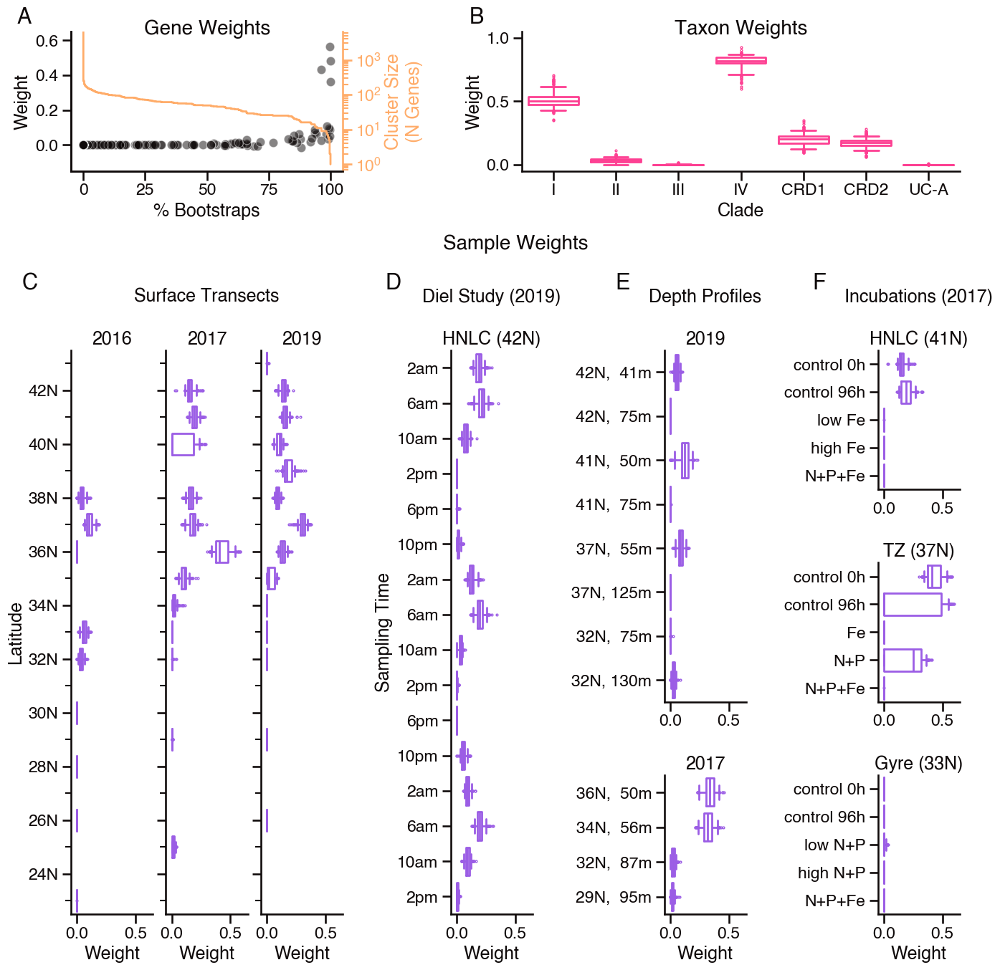

In [8]:
# plot and save cluster syn8 as an example cluster

# data and figure specs
genus = 'syn'
cluster = 8
ds = {'pro': pro_ds, 'syn': syn_ds}[genus]
rows = 17
cols = 38
clade_color = {'pro': sns.color_palette()[2], 'syn': sns.color_palette()[3]}[genus]
sample_color = sns.color_palette()[0]
annot_kwgs = {
    'xycoords': 'axes fraction', 'va': 'center', 'ha': 'left', 'fontsize': 22, 'annotation_clip': False
}
sample_weight_range = (-0.05, 0.65)
fliersize = 2

# datapath
outdir = Path('../../figures/6-clusters/')
    
# set up data
sampleweight_df = pd.merge(
    left=ds.SampleWeight.sel(Component=cluster).to_series().reset_index(), 
    right=metadata_df, 
    on='SampleName', 
    how='left'
)
taxonweight_df = ds.TaxonWeight.sel(Component=cluster).to_series().reset_index()
taxonweight_df['Clade'] = taxonweight_df['Clade'].map(clade_display_names)
geneweight_df = ds.GeneWeight.sel(Component=cluster).to_series().reset_index()
geneweight_df['Nonzero'] = (geneweight_df.GeneWeight != 0.)
# geneweight_df['% Bootstraps'] = geneweight_df.Ortholog.map(geneweight_df.groupby('Ortholog').Nonzero.mean()) * 100
geneweight_df = geneweight_df.groupby('Ortholog').agg(
    MeanWeight=('GeneWeight', 'mean'), 
    MedianWeight=('GeneWeight', 'median'), 
    BootstrapSupport=('Nonzero', 'mean')
).reset_index()
geneweight_df['% Bootstraps'] = geneweight_df.BootstrapSupport * 100

# set up figure
fig = plt.figure(figsize=(16, 16))
grid = plt.GridSpec(rows, cols, wspace=1.2, hspace=0.6)

# plot gene weight data
axis = plt.subplot(grid[:3, :12])
axis.annotate('A', xy=(-0.2, 1.1), **annot_kwgs)
plot_df = geneweight_df
# sns.lineplot(data=plot_df, x='% Bootstraps', y='GeneWeight', estimator='median', errorbar=('pi', 90), err_style='bars', 
#              marker='.', linestyle='', color=ortho_color, alpha=1.0, ax=axis)
sns.scatterplot(data=plot_df, x='% Bootstraps', y='MedianWeight', color=sns.color_palette()[4], alpha=0.5, ax=axis)
axis.set(ylabel='Weight', ylim=(-0.15, 0.65))
axis.annotate('Gene Weights', xy=(.5, 1.02), xycoords='axes fraction', va='center', ha='center', fontsize=20)

# plot cluster size as a function of % bootstrap threshold
mpl.rcParams['axes.spines.right'] = True
axis2 = plt.twinx(axis)
color = sns.color_palette()[1]
sns.ecdfplot(geneweight_df['% Bootstraps'], stat='count', complementary=True, log_scale=[False, True], color=color, ax=axis2)
axis2.tick_params(axis='y', which='both', colors=color)
axis2.spines['right'].set_color(color)
axis2.set(ylabel='Cluster Size\n(N Genes)')
axis2.yaxis.label.set_color(color)
mpl.rcParams['axes.spines.right'] = False

# plot taxon weight data
axis = plt.subplot(grid[:3, 19:])
axis.annotate('B', xy=(-0.12, 1.1), **annot_kwgs)
plot_df = taxonweight_df
sns.boxplot(
    data=plot_df, x='Clade', y='TaxonWeight', color=clade_color, order=list(clade_display_names.values())[3:], 
    fill=False, whis=(5, 95), fliersize=fliersize, legend=False, ax=axis
)
axis.set(xlabel='Clade', ylabel='Weight', ylim=(-0.05, 1.05))
axis.annotate('Taxon Weights', xy=(.5, 1.02), xycoords='axes fraction', va='center', ha='center', fontsize=20)

# plot sample weight data
axis = plt.subplot(grid[4, :])
axis.set_axis_off()
axis.annotate('Sample Weights', xy=(.5, 1), xycoords='axes fraction', va='center', ha='center', fontsize=20)

# plot surface transect data
axis = plt.subplot(grid[5, :4])
axis.set_axis_off()
axis.annotate('C', xy=(-0.6, 1.4), **annot_kwgs)
axis = plt.subplot(grid[5, 4:8])
axis.set_axis_off()
axis.annotate('Surface Transects', xy=(.5, 1), xycoords='axes fraction', va='center', ha='center', fontsize=18)
n_bins = 21
bounds = (23, 43)
for i, year in enumerate([2016, 2017, 2019]):
    axis = plt.subplot(grid[6:, 4*i:4*i+4])
    # plot community composition
    plot_df = sampleweight_df[(sampleweight_df['Year'] == year) & (sampleweight_df['SampleGroup'] == 'surface transect')]
    latitudes = plot_df[
        ['SampleName', 'Latitude']].drop_duplicates().set_index('SampleName').sort_values('Latitude')['Latitude']
    lat_bins = unique_bins(latitudes, n_bins, bounds=bounds, reverse=False)
    plot_df['lat_idx'] = plot_df['SampleName'].map(dict(zip(latitudes.index, lat_bins)))
    sns.boxplot(
        data=plot_df, x='SampleWeight', y='lat_idx', color=sample_color, order=np.arange(n_bins), 
        orient='y', fill=False, whis=(5, 95), fliersize=fliersize, legend=False, ax=axis
    )
    if not i:
        axis.set_yticks(np.arange(1, n_bins, 2), [f'{l}N' for l in np.arange(bounds[0]+1, bounds[1], 2)])
        axis.set(xlabel='Weight', ylabel='Latitude', xlim=sample_weight_range, ylim=(-0.5, n_bins-0.5), title=year)
    else: 
        axis.set_yticks(np.arange(1, n_bins, 2))
        axis.tick_params(labelleft=False)
        axis.set(xlabel='Weight', ylabel='', xlim=sample_weight_range, ylim=(-0.5, n_bins-0.5), title=year)
    axis.set_yticks(np.arange(n_bins), minor=True)

# plot diel data
axis = plt.subplot(grid[5, 16:20])
axis.set_axis_off()
axis.annotate('D', xy=(-0.8, 1.4), **annot_kwgs)
axis.annotate('Diel Study (2019)', xy=(0.5, 1), xycoords='axes fraction', va='center', ha='center', fontsize=18)
axis = plt.subplot(grid[6:, 16:20])
plot_df = sampleweight_df[sampleweight_df['SampleGroup'] == 'diel study'].sort_values('Datetime', ascending=False)
n_samples = plot_df['SampleName'].nunique()
plot_df['idx'] = plot_df['SampleName'].map(dict(zip(plot_df['SampleName'].unique(), np.arange(n_samples))))
sns.boxplot(
    data=plot_df, x='SampleWeight', y='idx', color=sample_color, 
    orient='y', fill=False, whis=(5, 95), fliersize=fliersize, legend=False, ax=axis
)
axis.set(xlabel='Weight', ylabel='Sampling Time', xlim=sample_weight_range, ylim=(-0.5, n_samples-0.5), title='HNLC (42N)')
axis.set_yticks(np.arange(n_samples), plot_df[['SampleName', 'TimeClass']].drop_duplicates()['TimeClass']);

# plot depth data
axis = plt.subplot(grid[5, 25:29])
axis.set_axis_off()
axis.annotate('E', xy=(-0.6, 1.4), **annot_kwgs)
axis.annotate('Depth Profiles', xy=(0.5, 1), xycoords='axes fraction', va='center', ha='center', fontsize=18)
for i, year in enumerate([2019, 2017]):
    axis = plt.subplot(grid[6+(i*8):13+(i*4), 25:29])
    # plot community composition
    plot_df = sampleweight_df[(sampleweight_df['SampleGroup'] == 'depth profiles') & (sampleweight_df['Year'] == year)].sort_values(
        ['Latitude', 'Depth'], ascending=[True, False])
    n_samples = plot_df['SampleName'].nunique()
    plot_df['idx'] = plot_df['SampleName'].map(dict(zip(plot_df['SampleName'].unique(), np.arange(n_samples))))
    sns.boxplot(
        data=plot_df, x='SampleWeight', y='idx', color=sample_color, 
        orient='y', fill=False, whis=(5, 95), fliersize=fliersize, legend=False, ax=axis
    )
    axis.set(xlabel=('Weight' if i else None), ylabel=None, xlim=sample_weight_range, ylim=(-0.5, n_samples-0.5), title=year)
    label_df = plot_df[['SampleName', 'Depth', 'Latitude']].drop_duplicates()
    labels = [f"{int(r['Latitude'])}N,{r['Depth']:4}m" for _, r in label_df.iterrows()]
    axis.set_yticks(np.arange(n_samples), labels);

# plot incubation data
axis = plt.subplot(grid[5, 34:])
axis.set_axis_off()
axis.annotate('F', xy=(-0.8, 1.4), **annot_kwgs)
axis.annotate('Incubations (2017)', xy=(0.5, 1), xycoords='axes fraction', va='center', ha='center', fontsize=18)
incubation_treatment_order = {
    'HNLC': ['control 0h', 'control 96h', 'low Fe', 'high Fe', 'N+P+Fe'],
    'TZ': ['control 0h', 'control 96h', 'Fe', 'N+P', 'N+P+Fe'], 
    'gyre': ['control 0h', 'control 96h', 'low N+P', 'high N+P', 'N+P+Fe']
}
for i, condition in enumerate(['HNLC', 'TZ', 'gyre']):
    axis = plt.subplot(grid[6+(4*i):9+(4*i), 34:])
    data_df = sampleweight_df[sampleweight_df['Condition'] == condition]
    plot_df = data_df[data_df['Dataset'] != 'Bryn amendment incubation']
    plot_df['Treatment'] = pd.Categorical(plot_df['Treatment'], incubation_treatment_order[condition])
    sns.boxplot(
        data=plot_df.sort_values('Treatment'), x='SampleWeight', y='Treatment', color=sample_color, 
        orient='y', fill=False, whis=(5, 95), fliersize=fliersize, legend=False, ax=axis
    )
    axis.set(xlabel=('Weight' if i==2 else None), ylabel=None, xlim=sample_weight_range, 
             title={'HNLC': 'HNLC (41N)', 'TZ': 'TZ (37N)', 'gyre': 'Gyre (33N)'}[condition])

# save/show figure
fig.savefig(outdir / 'example-cluster-profile-{}{}.png'.format(genus, cluster), bbox_inches='tight')
plt.show()


# Cluster summary stats

In [9]:
# Prochlorococcus

pro_med_geneweights_df = pro_ds.GeneWeight.median(dim=['Bootstrap', 'Replicate']).T.to_pandas()
pro_cluster_sizes = (pro_med_geneweights_df != 0).sum(axis=0)
total_cycogs = pro_med_geneweights_df.shape[0]
pro_repped_cycogs = (pro_med_geneweights_df != 0).any(axis=1)

print(f'min cluster size: {pro_cluster_sizes.min()}')
print(f'max cluster size: {pro_cluster_sizes.max()}')
print(f'median cluster size: {pro_cluster_sizes.median()}')
print(f'\n{pro_repped_cycogs.sum()} out of {total_cycogs} CyCOGs represented in at least one cluster')


min cluster size: 4
max cluster size: 100
median cluster size: 22.0

404 out of 5023 CyCOGs represented in at least one cluster


In [10]:
# Synechococcus

syn_med_geneweights_df = syn_ds.GeneWeight.median(dim=['Bootstrap', 'Replicate']).T.to_pandas()
syn_cluster_sizes = (syn_med_geneweights_df != 0).sum(axis=0)
total_cycogs = syn_med_geneweights_df.shape[0]
syn_repped_cycogs = (syn_med_geneweights_df != 0).any(axis=1)

print(f'min cluster size: {syn_cluster_sizes.min()}')
print(f'max cluster size: {syn_cluster_sizes.max()}')
print(f'median cluster size: {syn_cluster_sizes.median()}')
print(f'\n{syn_repped_cycogs.sum()} out of {total_cycogs} CyCOGs represented in at least one cluster')


min cluster size: 0
max cluster size: 107
median cluster size: 61.0

638 out of 6478 CyCOGs represented in at least one cluster


In [11]:
# look at combined annotations

pro_annotations = pro_ds.Annotation.sel(Ortholog=pro_repped_cycogs[pro_repped_cycogs].index).to_pandas()
syn_annotations = syn_ds.Annotation.sel(Ortholog=syn_repped_cycogs[syn_repped_cycogs].index).to_pandas()
combo_annotations = pd.concat([pro_annotations, syn_annotations]).reset_index().drop_duplicates().rename(columns={0: 'Annotation'})
total_cycogs = combo_annotations.shape[0]
unknowns = combo_annotations[combo_annotations.Annotation == 'hypothetical protein'].shape[0]

print(f'{unknowns} CyCOGs of unknown function out of {total_cycogs} CyCOGs represented in at least one Pro or Syn cluster')


255 CyCOGs of unknown function out of 897 CyCOGs represented in at least one Pro or Syn cluster
